In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import math
import datetime
import pylab as pl
from IPython import display
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

%matplotlib inline

Using TensorFlow backend.


[name: "/cpu:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 12726071916044412720
]


In [2]:
# constans
features = 9
frequency = '1H'
split = 0.95
look_back = 5
look_forward = 4

In [3]:
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1, look_forward=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-look_back-look_forward+1): 
        dataX.append(dataset[i:(i+look_back), :])
        dataY.append(dataset[(i+look_back):(i+look_back+look_forward), 0])
    return np.array(dataX), np.array(dataY)

In [4]:
# fix random seed for reproducibility
np.random.seed(7)

In [5]:
# load data
df_trend = pd.read_csv('trends.csv', index_col=0, header=0, skiprows=2, engine='python')
df_trend.columns = ['trend']
df_trend.index = pd.to_datetime(df_trend.index, format='%Y-%m-%d')
print(df_trend.tail(5))

df = pd.read_csv('trades.csv', index_col=0, usecols=['timestamp','price','volume'], header=0, engine='python')
df.index = pd.to_datetime(df.index, unit='s')
print(df.tail(5))

            trend
Week             
2017-10-01     47
2017-10-08     71
2017-10-15     75
2017-10-22     78
2017-10-29    100
                              volume   price
timestamp                                   
2017-10-30 13:42:59.850500  0.005000  6155.5
2017-10-30 13:42:59.860700  0.001755  6155.5
2017-10-30 13:42:59.873800  0.002245  6155.4
2017-10-30 13:42:59.880000  0.002000  6155.4
2017-10-30 13:42:59.885300  0.044000  6155.4


In [6]:
# resample and extract features
df_pv = df.resample(frequency).agg({'price': np.mean, 'volume': np.sum})
df_ohlc = df['price'].resample(frequency).ohlc()
df_trend = df_trend.resample(frequency).mean()

df = pd.concat([df_pv, df_ohlc], axis=1)
df = pd.concat([df, df_trend], axis=1)
df = df.fillna(method='pad')
df['hour'] = [d.hour for d in df.index.time]
df['minute'] = [d.minute for d in df.index.time]
df = df.dropna()
print(df.tail(5))

                           price      volume    open    high     low   close  \
timestamp                                                                      
2017-10-30 09:00:00  6145.511491  114.993351  6134.8  6167.8  6120.4  6157.0   
2017-10-30 10:00:00  6180.621465  185.608750  6157.0  6206.0  6131.8  6189.0   
2017-10-30 11:00:00  6192.173667  162.852360  6189.0  6232.4  6151.0  6158.2   
2017-10-30 12:00:00  6135.849672   96.037807  6155.1  6177.2  6120.0  6140.0   
2017-10-30 13:00:00  6147.621118   62.172016  6140.0  6169.1  6132.4  6155.4   

                     trend  hour  minute  
timestamp                                 
2017-10-30 09:00:00  100.0     9       0  
2017-10-30 10:00:00  100.0    10       0  
2017-10-30 11:00:00  100.0    11       0  
2017-10-30 12:00:00  100.0    12       0  
2017-10-30 13:00:00  100.0    13       0  


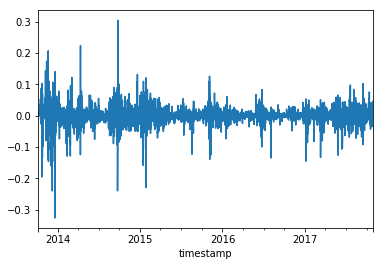

In [7]:
# preprocess: logarithm and ewma
df['price'] = np.log(df['price'])
df['volume'] = np.log(df['volume'])
df['open'] = np.log(df['open'])
df['high'] = np.log(df['high'])
df['low'] = np.log(df['low'])
df['close'] = np.log(df['close'])
ewma = df.ewm(halflife=7).mean()
df = df - ewma

df['price'].plot()

dataset = df.values

In [8]:
# split into train and test sets
train_size = int(len(dataset) * split)
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]

In [9]:
# scale data
scaler = MinMaxScaler(feature_range=(0, 1))
train = scaler.fit_transform(train)
test = scaler.transform(test)

scaler_price = MinMaxScaler(feature_range=(0, 1))
scaler_price.fit_transform(train[:,0].reshape(-1, 1))

array([[ 0.51711595],
       [ 0.51711595],
       [ 0.51711595],
       ..., 
       [ 0.53323548],
       [ 0.53251287],
       [ 0.53269424]])

In [10]:
# reshape into X=t and Y=t+1
trainX, trainY = create_dataset(train, look_back, look_forward)
testX, testY = create_dataset(test, look_back, look_forward)

In [11]:
# create and load model
batch_size = 1
model = Sequential()
model.add(LSTM(4, batch_input_shape=(batch_size, look_back, features), stateful=True, return_sequences=True))
model.add(LSTM(4, batch_input_shape=(batch_size, look_back, features), stateful=True))
model.add(Dense(look_forward))
try:
    model.load_weights("model_forward.h5")
except:
    pass
model.compile(loss='mean_squared_error', optimizer='adam')

Epoch 1/1
 - 100s - loss: 6.0444e-04
Train Score: 0.02667 RMSE
Test Score: 0.02425 RMSE


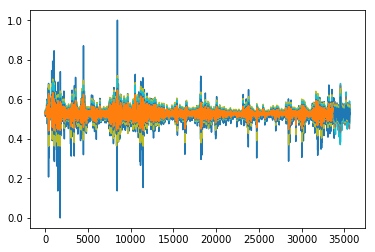

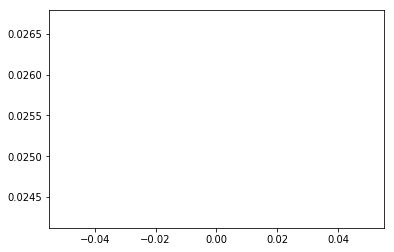

Epoch 1/1
 - 98s - loss: 5.9425e-04
Train Score: 0.02657 RMSE
Test Score: 0.02407 RMSE


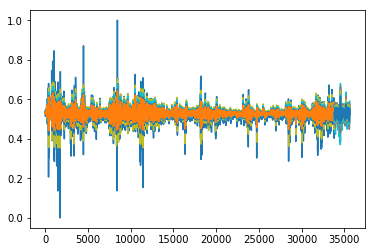

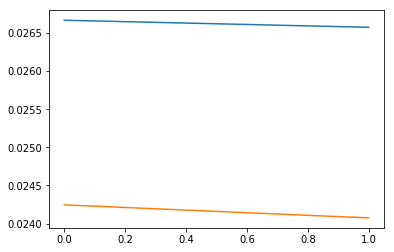

Epoch 1/1
 - 98s - loss: 5.8150e-04
Train Score: 0.02563 RMSE
Test Score: 0.02284 RMSE


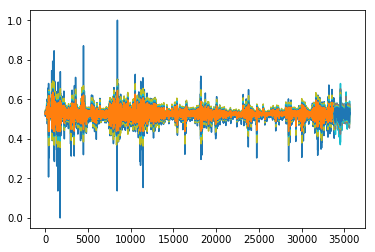

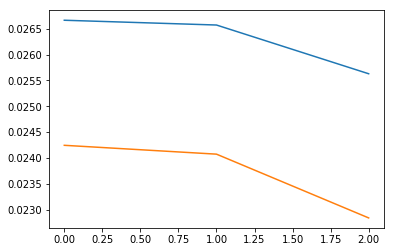

Epoch 1/1
 - 100s - loss: 5.7459e-04
Train Score: 0.02558 RMSE
Test Score: 0.02272 RMSE


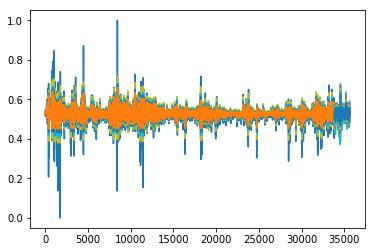

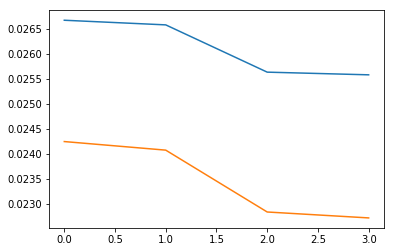

Epoch 1/1
 - 97s - loss: 5.7343e-04
Train Score: 0.02558 RMSE
Test Score: 0.02266 RMSE


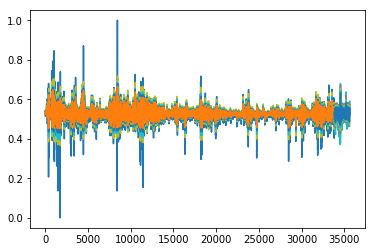

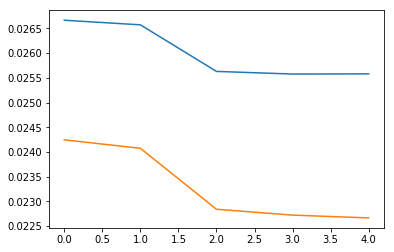

Epoch 1/1
 - 98s - loss: 5.7120e-04
Train Score: 0.02559 RMSE
Test Score: 0.02256 RMSE


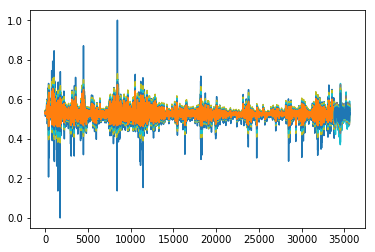

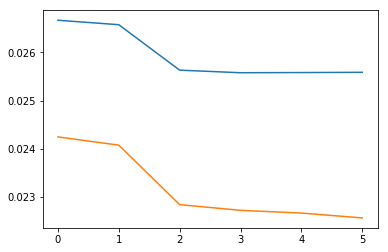

Epoch 1/1
 - 98s - loss: 5.7473e-04
Train Score: 0.02558 RMSE
Test Score: 0.02260 RMSE


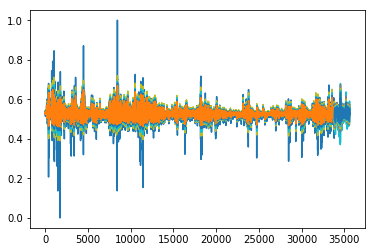

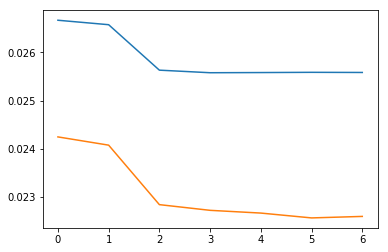

Epoch 1/1
 - 97s - loss: 5.7265e-04
Train Score: 0.02506 RMSE
Test Score: 0.02209 RMSE


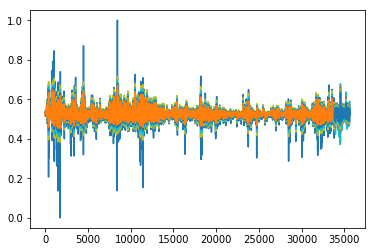

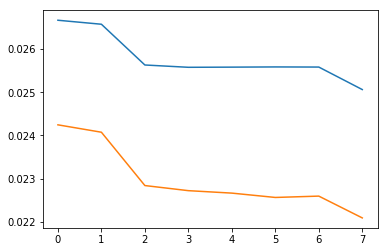

Epoch 1/1
 - 98s - loss: 5.7185e-04
Train Score: 0.02534 RMSE
Test Score: 0.02226 RMSE


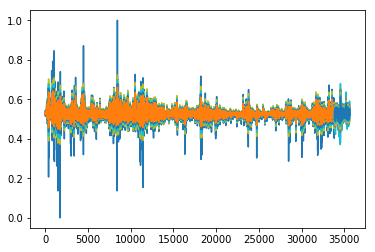

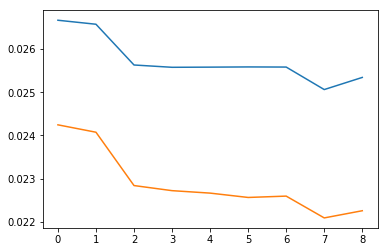

Epoch 1/1
 - 96s - loss: 5.6976e-04
Train Score: 0.02491 RMSE
Test Score: 0.02183 RMSE


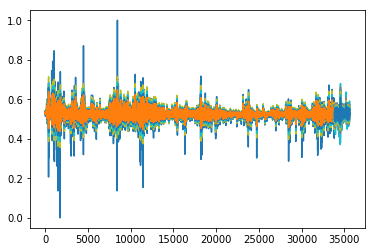

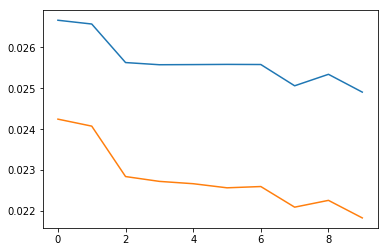

Epoch 1/1
 - 98s - loss: 5.6739e-04
Train Score: 0.02511 RMSE
Test Score: 0.02213 RMSE


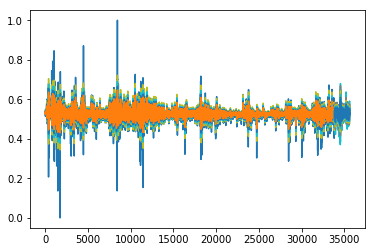

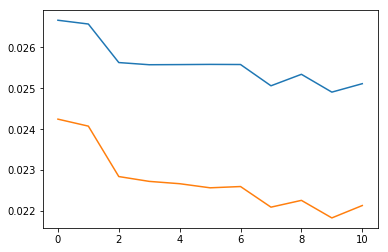

Epoch 1/1
 - 97s - loss: 5.6647e-04
Train Score: 0.02528 RMSE
Test Score: 0.02217 RMSE


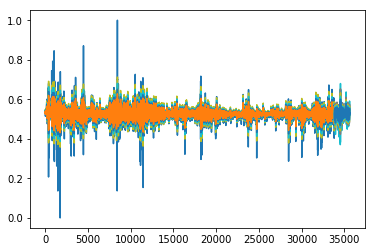

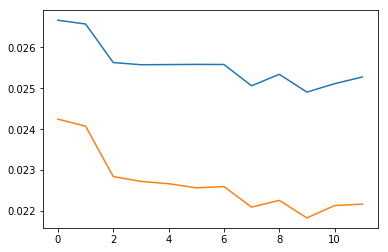

Epoch 1/1
 - 97s - loss: 5.5784e-04
Train Score: 0.02471 RMSE
Test Score: 0.02176 RMSE


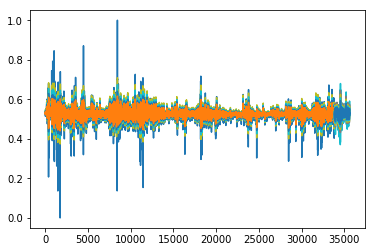

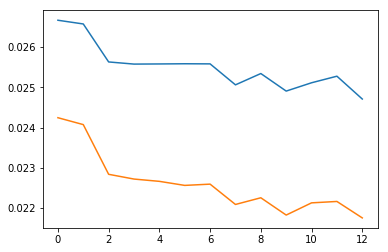

Epoch 1/1
 - 97s - loss: 5.5411e-04
Train Score: 0.02511 RMSE
Test Score: 0.02181 RMSE


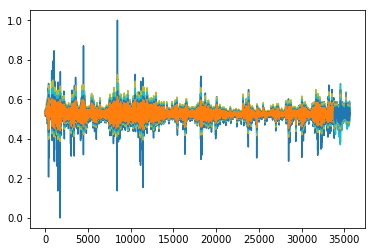

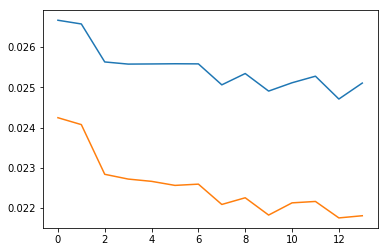

Epoch 1/1
 - 99s - loss: 5.5230e-04
Train Score: 0.02474 RMSE
Test Score: 0.02151 RMSE


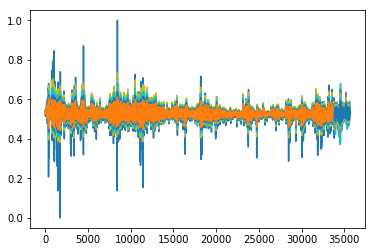

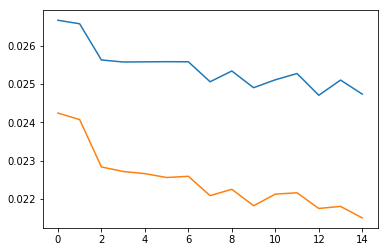

Epoch 1/1
 - 97s - loss: 5.4961e-04
Train Score: 0.02415 RMSE
Test Score: 0.02095 RMSE


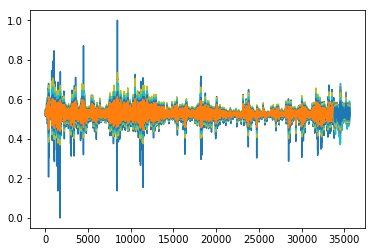

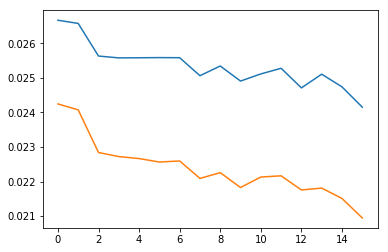

Epoch 1/1
 - 98s - loss: 5.4759e-04
Train Score: 0.02440 RMSE
Test Score: 0.02109 RMSE


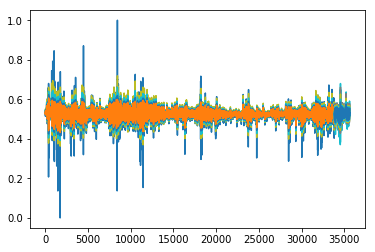

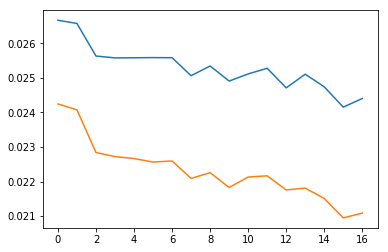

Epoch 1/1
 - 98s - loss: 5.4726e-04
Train Score: 0.02450 RMSE
Test Score: 0.02128 RMSE


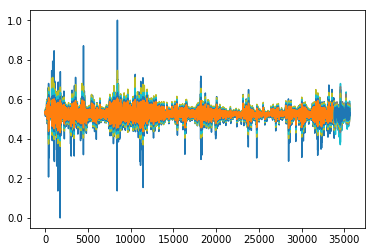

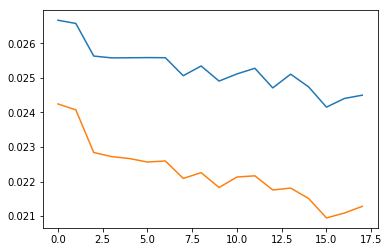

Epoch 1/1
 - 96s - loss: 5.4542e-04
Train Score: 0.02443 RMSE
Test Score: 0.02128 RMSE


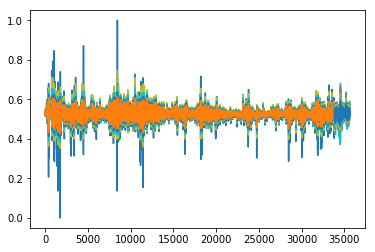

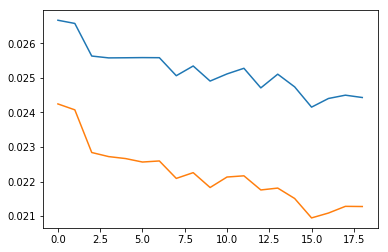

Epoch 1/1
 - 96s - loss: 5.4253e-04
Train Score: 0.02426 RMSE
Test Score: 0.02117 RMSE


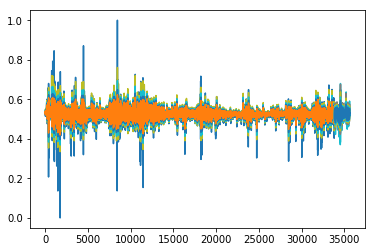

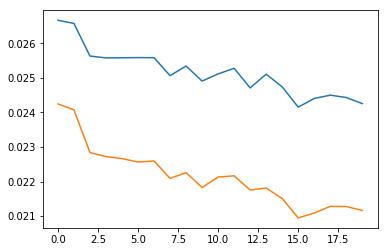

Epoch 1/1
 - 98s - loss: 5.4054e-04
Train Score: 0.02420 RMSE
Test Score: 0.02117 RMSE


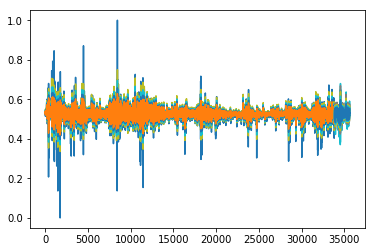

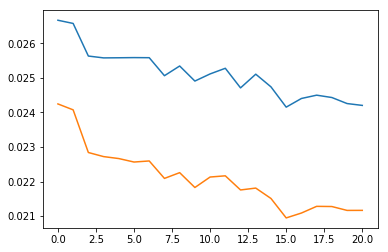

Epoch 1/1
 - 96s - loss: 5.3908e-04
Train Score: 0.02410 RMSE
Test Score: 0.02103 RMSE


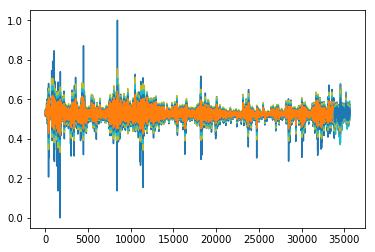

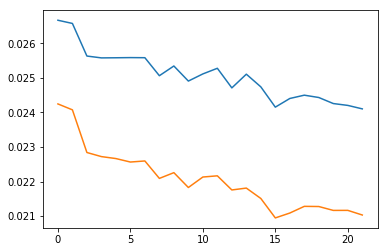

Epoch 1/1
 - 97s - loss: 5.3747e-04
Train Score: 0.02404 RMSE
Test Score: 0.02097 RMSE


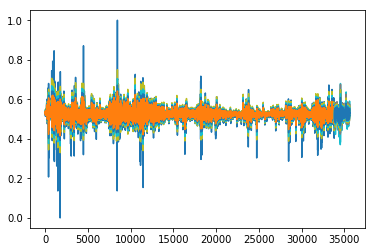

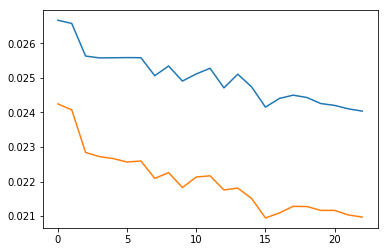

Epoch 1/1
 - 96s - loss: 5.3654e-04
Train Score: 0.02404 RMSE
Test Score: 0.02096 RMSE


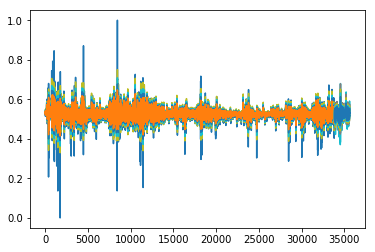

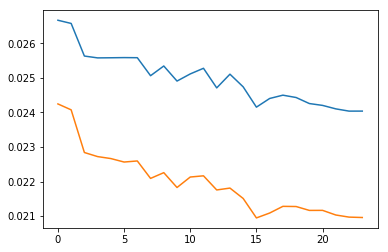

Epoch 1/1
 - 96s - loss: 5.3593e-04
Train Score: 0.02397 RMSE
Test Score: 0.02080 RMSE


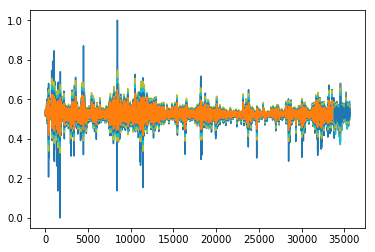

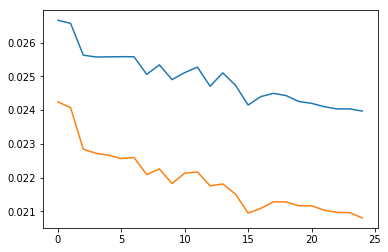

Epoch 1/1
 - 98s - loss: 5.3608e-04
Train Score: 0.02396 RMSE
Test Score: 0.02085 RMSE


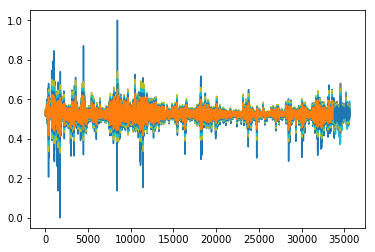

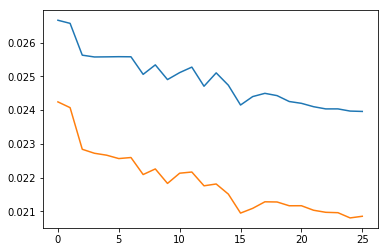

Epoch 1/1
 - 96s - loss: 5.3861e-04
Train Score: 0.02391 RMSE
Test Score: 0.02075 RMSE


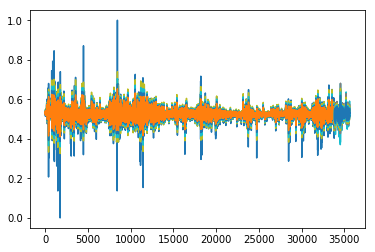

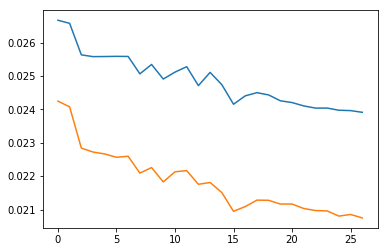

Epoch 1/1
 - 96s - loss: 5.3631e-04
Train Score: 0.02387 RMSE
Test Score: 0.02071 RMSE


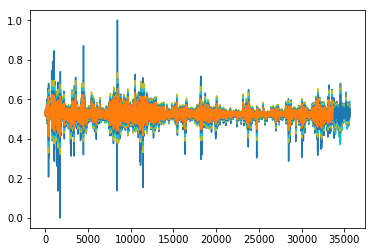

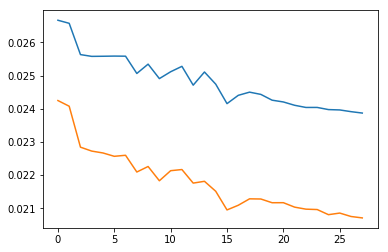

Epoch 1/1
 - 98s - loss: 5.3628e-04
Train Score: 0.02384 RMSE
Test Score: 0.02064 RMSE


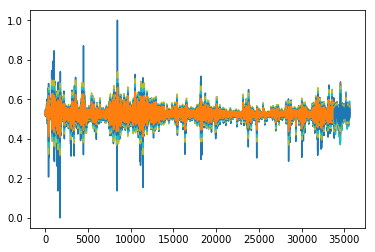

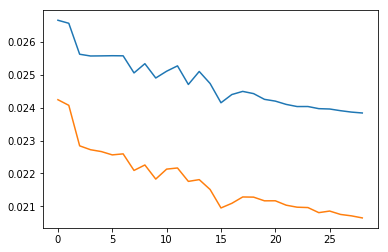

Epoch 1/1
 - 95s - loss: 5.3506e-04
Train Score: 0.02382 RMSE
Test Score: 0.02056 RMSE


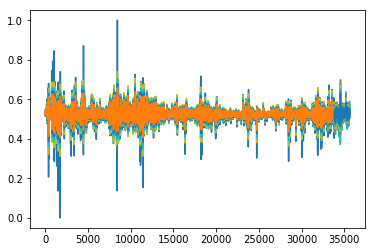

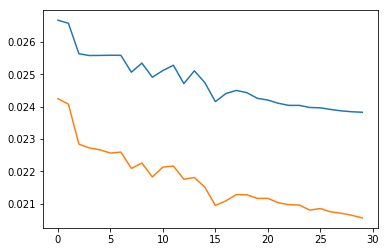

Epoch 1/1
 - 97s - loss: 5.3523e-04
Train Score: 0.02389 RMSE
Test Score: 0.02052 RMSE


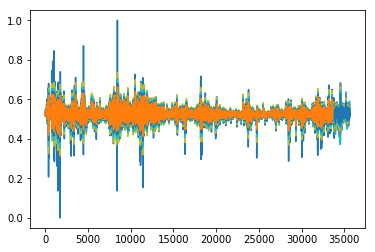

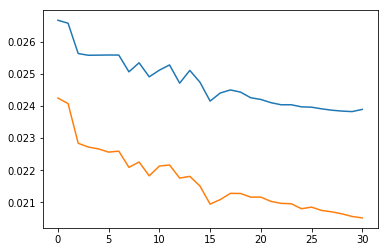

Epoch 1/1
 - 97s - loss: 5.3503e-04
Train Score: 0.02376 RMSE
Test Score: 0.02039 RMSE


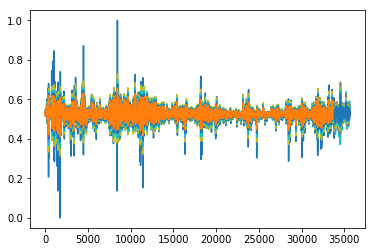

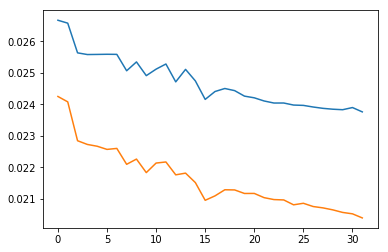

Epoch 1/1
 - 96s - loss: 5.3784e-04
Train Score: 0.02371 RMSE
Test Score: 0.02034 RMSE


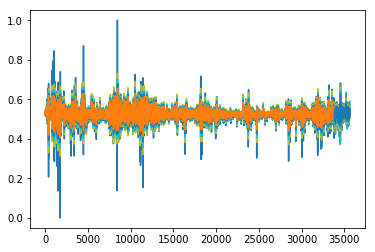

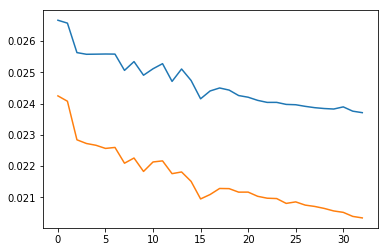

Epoch 1/1
 - 98s - loss: 5.3527e-04
Train Score: 0.02397 RMSE
Test Score: 0.02053 RMSE


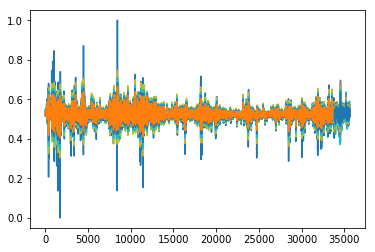

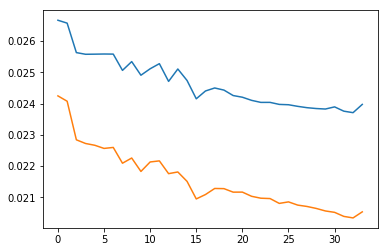

Epoch 1/1
 - 96s - loss: 5.3805e-04
Train Score: 0.02403 RMSE
Test Score: 0.02058 RMSE


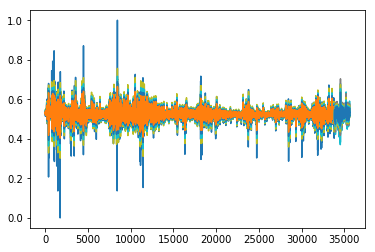

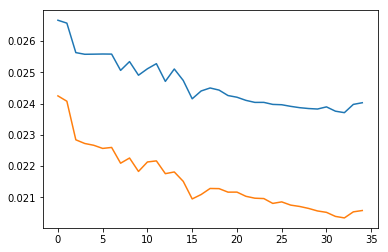

Epoch 1/1
 - 97s - loss: 5.3528e-04
Train Score: 0.02395 RMSE
Test Score: 0.02057 RMSE


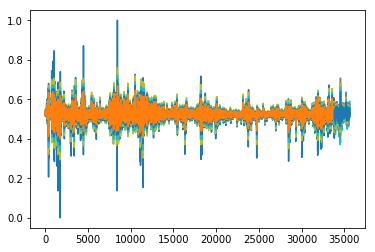

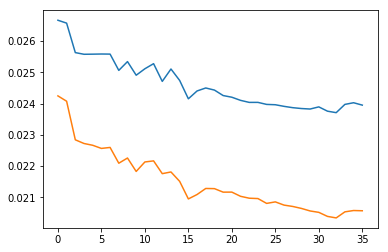

Epoch 1/1
 - 97s - loss: 5.3044e-04
Train Score: 0.02400 RMSE
Test Score: 0.02056 RMSE


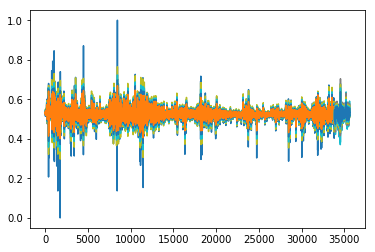

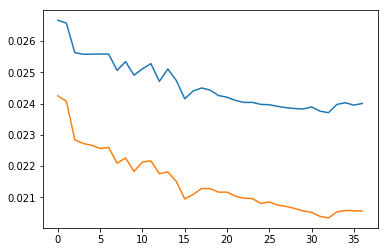

Epoch 1/1
 - 98s - loss: 5.2952e-04
Train Score: 0.02383 RMSE
Test Score: 0.02049 RMSE


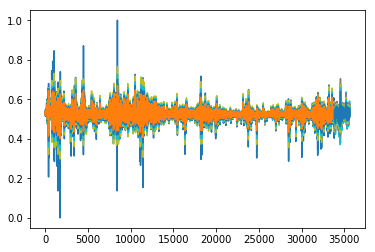

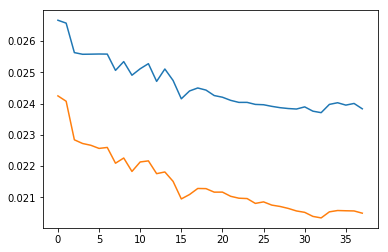

Epoch 1/1
 - 99s - loss: 5.2771e-04
Train Score: 0.02364 RMSE
Test Score: 0.02029 RMSE


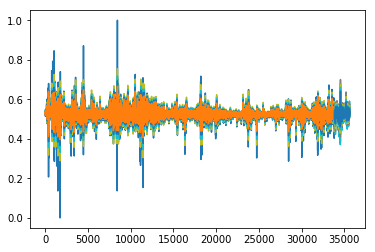

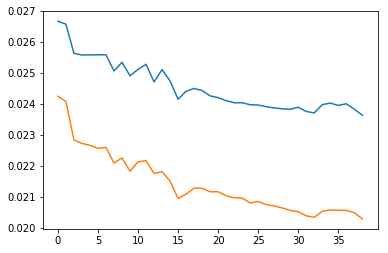

Epoch 1/1
 - 97s - loss: 5.2634e-04
Train Score: 0.02341 RMSE
Test Score: 0.02014 RMSE


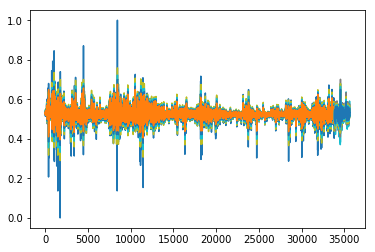

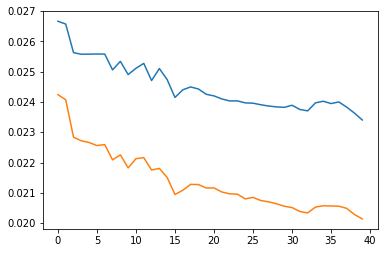

Epoch 1/1
 - 98s - loss: 5.2285e-04
Train Score: 0.02339 RMSE
Test Score: 0.02013 RMSE


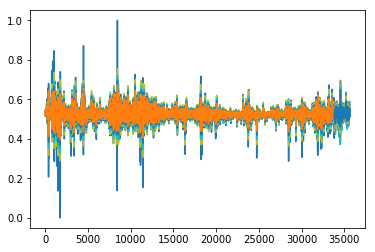

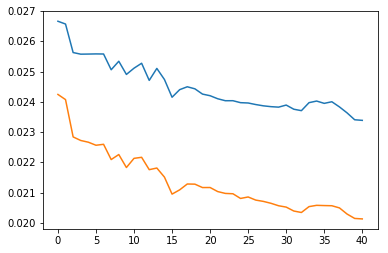

Epoch 1/1
 - 99s - loss: 5.2457e-04
Train Score: 0.02345 RMSE
Test Score: 0.02018 RMSE


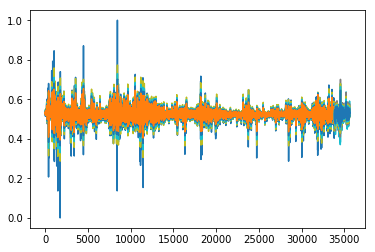

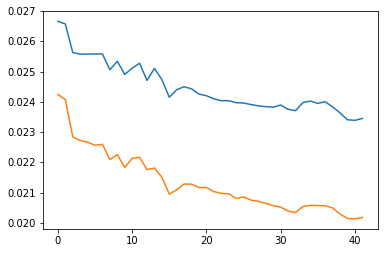

Epoch 1/1
 - 96s - loss: 5.2317e-04
Train Score: 0.02344 RMSE
Test Score: 0.02013 RMSE


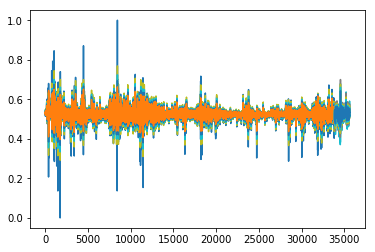

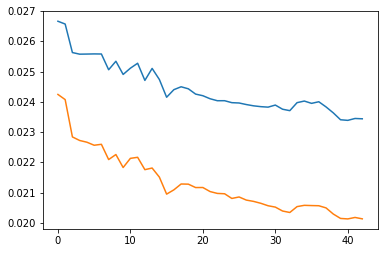

Epoch 1/1
 - 98s - loss: 5.2258e-04
Train Score: 0.02343 RMSE
Test Score: 0.02015 RMSE


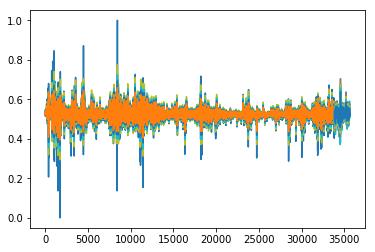

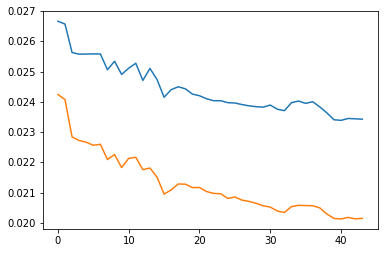

Epoch 1/1
 - 96s - loss: 5.2104e-04
Train Score: 0.02342 RMSE
Test Score: 0.02017 RMSE


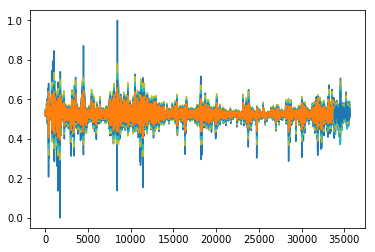

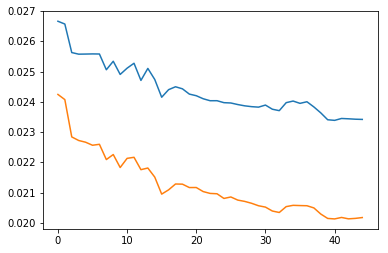

Epoch 1/1
 - 96s - loss: 5.2022e-04
Train Score: 0.02334 RMSE
Test Score: 0.02014 RMSE


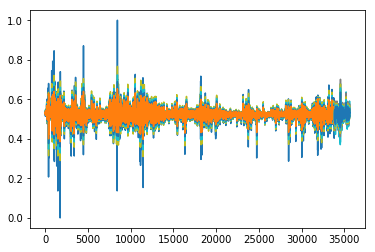

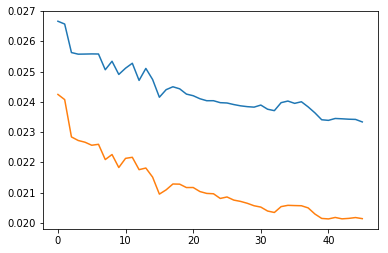

Epoch 1/1
 - 97s - loss: 5.2206e-04
Train Score: 0.02340 RMSE
Test Score: 0.02014 RMSE


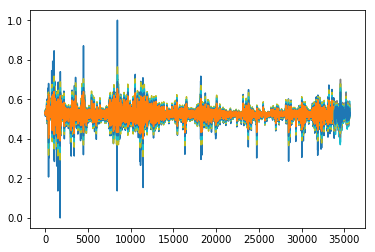

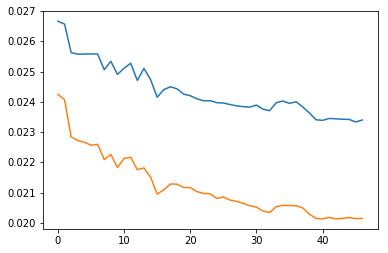

Epoch 1/1
 - 98s - loss: 5.2073e-04
Train Score: 0.02339 RMSE
Test Score: 0.02012 RMSE


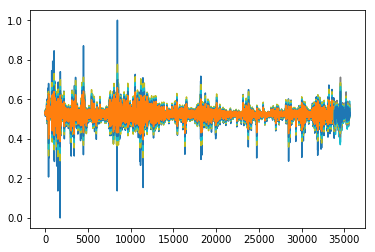

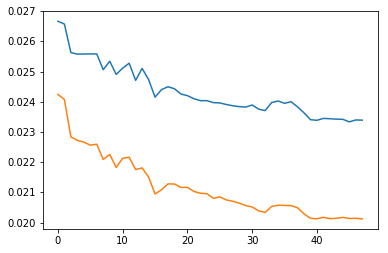

Epoch 1/1
 - 96s - loss: 5.1962e-04
Train Score: 0.02340 RMSE
Test Score: 0.02013 RMSE


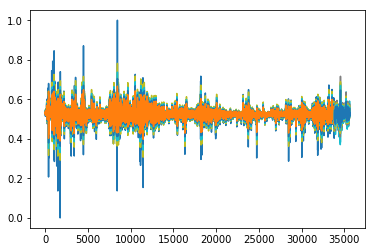

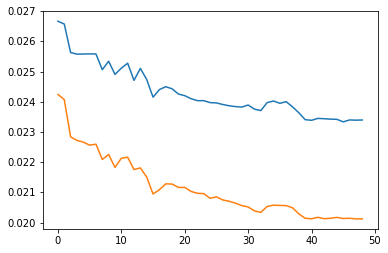

Epoch 1/1
 - 98s - loss: 5.1995e-04
Train Score: 0.02351 RMSE
Test Score: 0.02012 RMSE


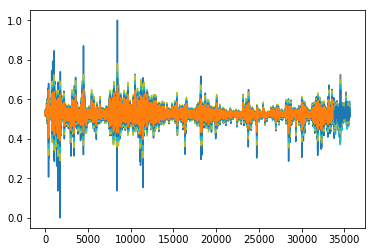

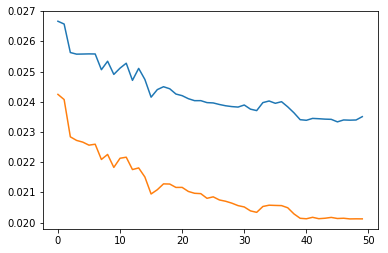

Epoch 1/1
 - 97s - loss: 5.2102e-04
Train Score: 0.02338 RMSE
Test Score: 0.02005 RMSE


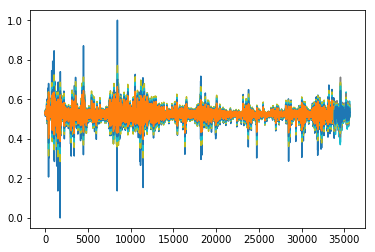

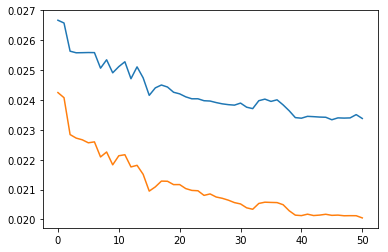

Epoch 1/1
 - 97s - loss: 5.2338e-04
Train Score: 0.02348 RMSE
Test Score: 0.02008 RMSE


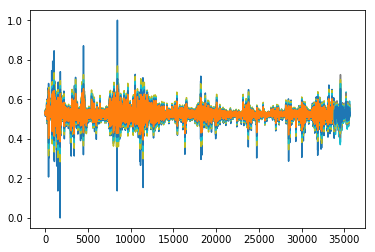

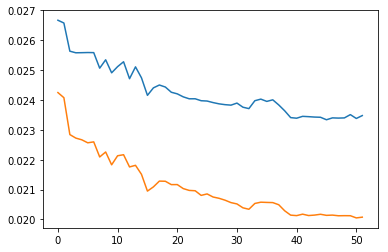

Epoch 1/1
 - 99s - loss: 5.1854e-04
Train Score: 0.02343 RMSE
Test Score: 0.02003 RMSE


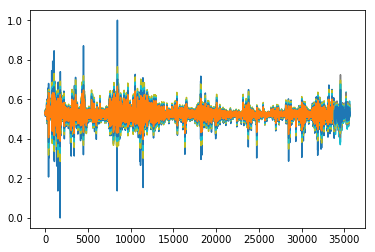

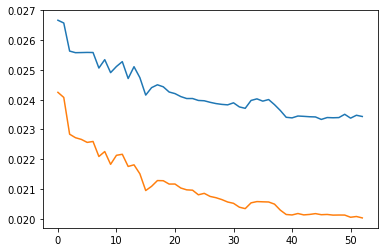

Epoch 1/1
 - 97s - loss: 5.1728e-04
Train Score: 0.02361 RMSE
Test Score: 0.02021 RMSE


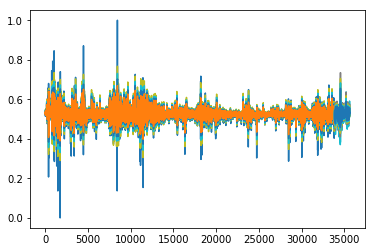

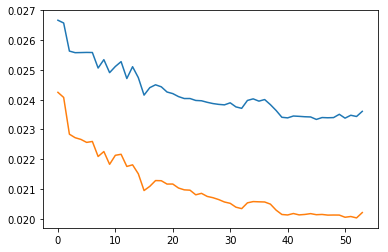

Epoch 1/1
 - 98s - loss: 5.1874e-04
Train Score: 0.02345 RMSE
Test Score: 0.02008 RMSE


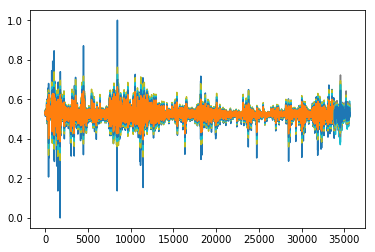

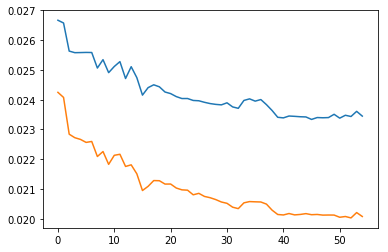

Epoch 1/1
 - 98s - loss: 5.1936e-04
Train Score: 0.02361 RMSE
Test Score: 0.02019 RMSE


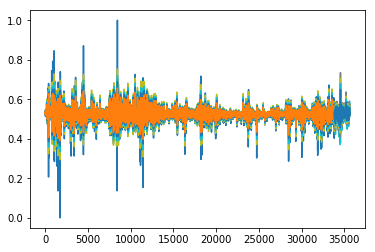

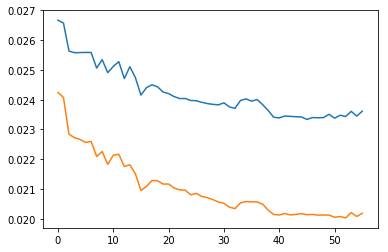

Epoch 1/1
 - 97s - loss: 5.1940e-04
Train Score: 0.02335 RMSE
Test Score: 0.01991 RMSE


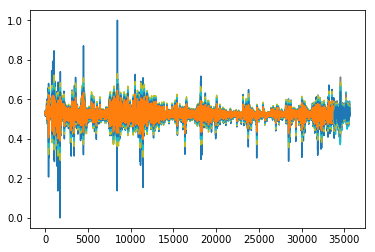

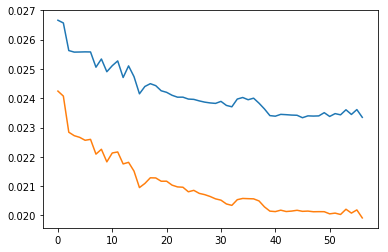

Epoch 1/1
 - 99s - loss: 5.2029e-04
Train Score: 0.02362 RMSE
Test Score: 0.02016 RMSE


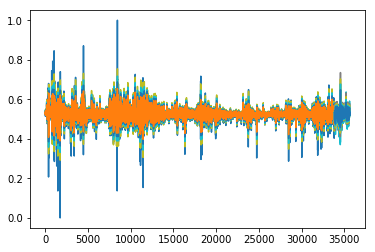

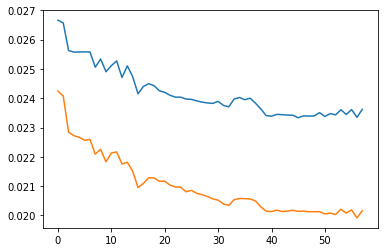

Epoch 1/1
 - 97s - loss: 5.2310e-04
Train Score: 0.02355 RMSE
Test Score: 0.02010 RMSE


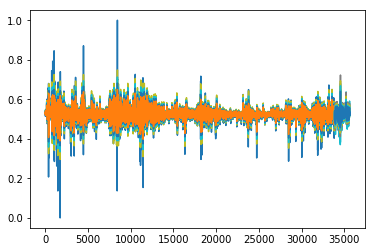

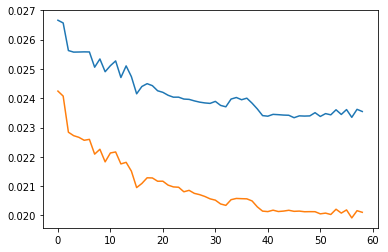

Epoch 1/1
 - 98s - loss: 5.2208e-04
Train Score: 0.02353 RMSE
Test Score: 0.02005 RMSE


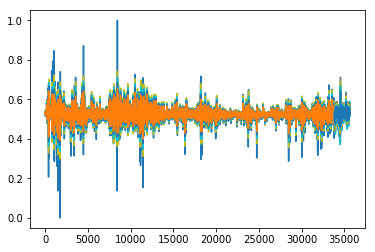

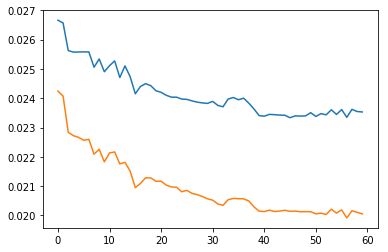

Epoch 1/1
 - 96s - loss: 5.2141e-04
Train Score: 0.02343 RMSE
Test Score: 0.01995 RMSE


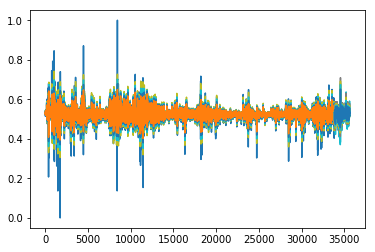

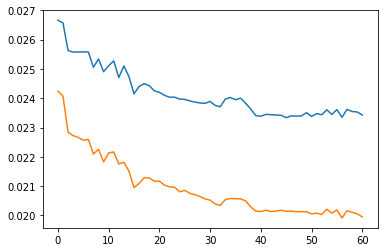

Epoch 1/1
 - 97s - loss: 5.2079e-04
Train Score: 0.02343 RMSE
Test Score: 0.01999 RMSE


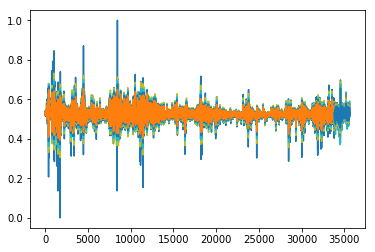

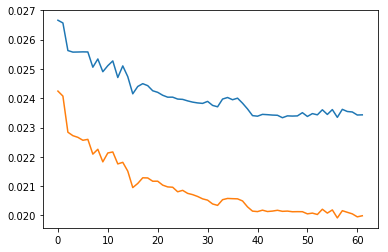

Epoch 1/1
 - 96s - loss: 5.1996e-04
Train Score: 0.02326 RMSE
Test Score: 0.01987 RMSE


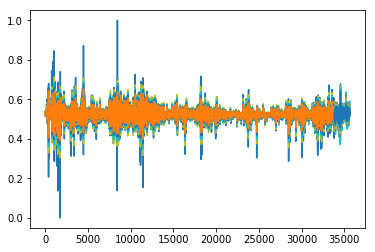

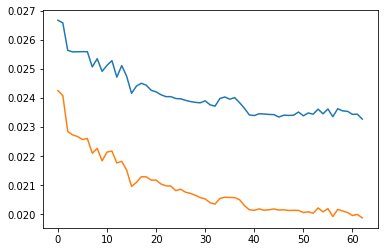

Epoch 1/1
 - 99s - loss: 5.2098e-04
Train Score: 0.02332 RMSE
Test Score: 0.01999 RMSE


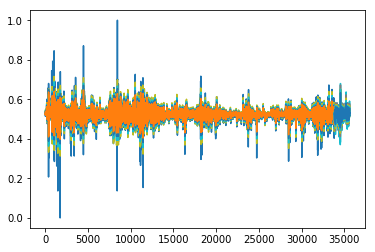

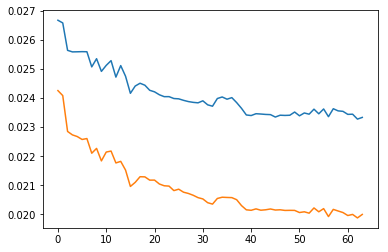

Epoch 1/1
 - 96s - loss: 5.2204e-04
Train Score: 0.02324 RMSE
Test Score: 0.01983 RMSE


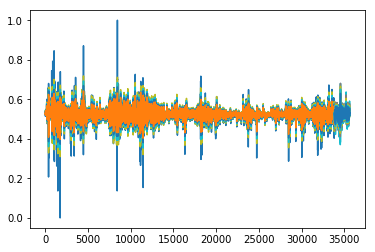

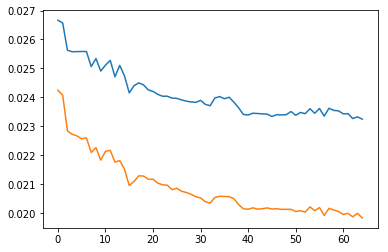

Epoch 1/1
 - 97s - loss: 5.1964e-04
Train Score: 0.02330 RMSE
Test Score: 0.01986 RMSE


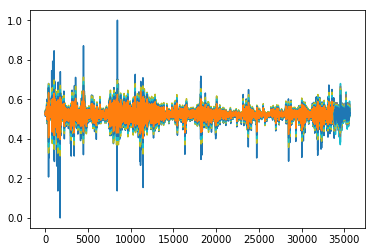

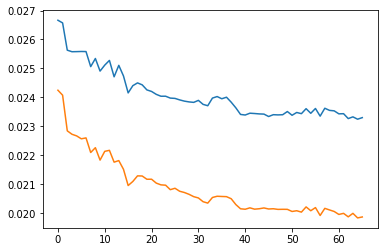

Epoch 1/1
 - 99s - loss: 5.1985e-04
Train Score: 0.02327 RMSE
Test Score: 0.01987 RMSE


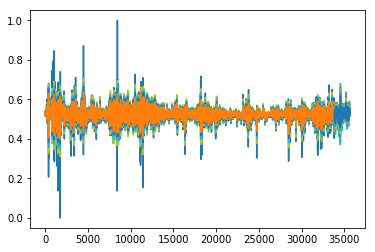

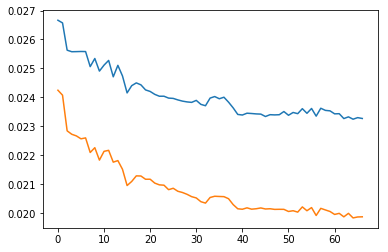

Epoch 1/1
 - 97s - loss: 5.1878e-04
Train Score: 0.02332 RMSE
Test Score: 0.01983 RMSE


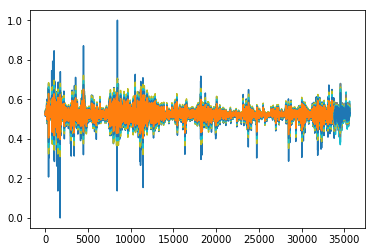

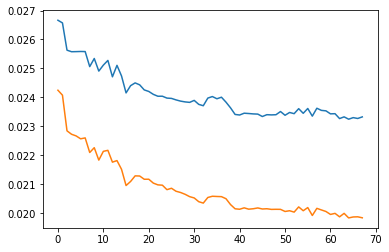

Epoch 1/1
 - 99s - loss: 5.1977e-04
Train Score: 0.02312 RMSE
Test Score: 0.01961 RMSE


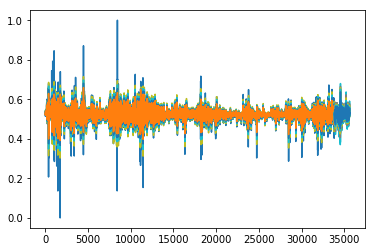

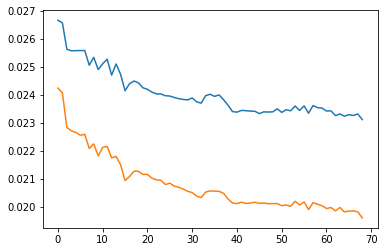

Epoch 1/1
 - 98s - loss: 5.1928e-04
Train Score: 0.02321 RMSE
Test Score: 0.01971 RMSE


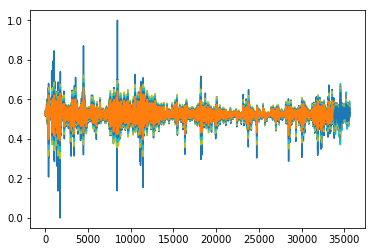

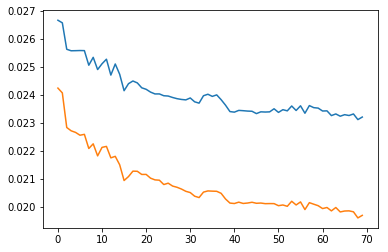

Epoch 1/1
 - 96s - loss: 5.1982e-04
Train Score: 0.02346 RMSE
Test Score: 0.01978 RMSE


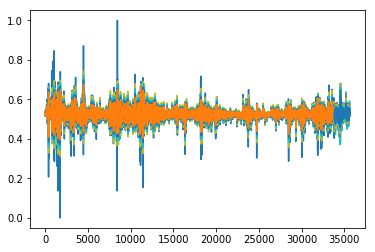

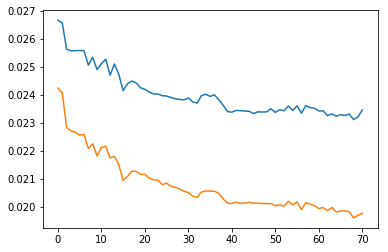

Epoch 1/1
 - 99s - loss: 5.2085e-04
Train Score: 0.03438 RMSE
Test Score: 0.02552 RMSE


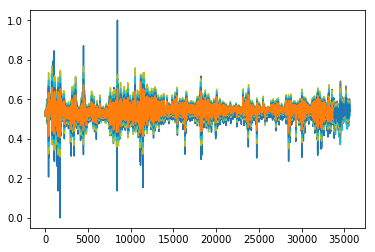

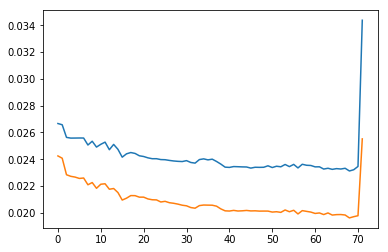

Epoch 1/1
 - 96s - loss: 5.2723e-04
Train Score: 0.02351 RMSE
Test Score: 0.02005 RMSE


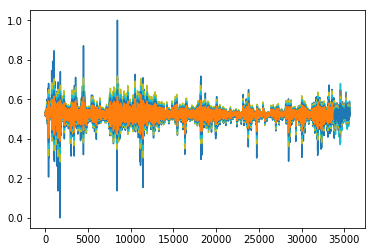

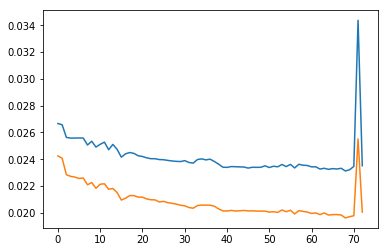

Epoch 1/1
 - 98s - loss: 5.1825e-04
Train Score: 0.02431 RMSE
Test Score: 0.02105 RMSE


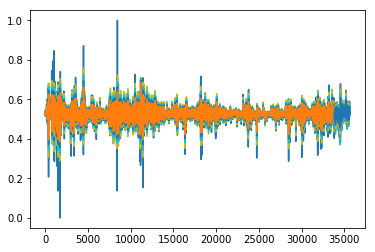

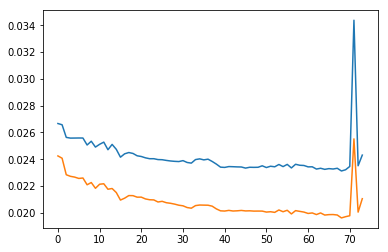

Epoch 1/1
 - 98s - loss: 5.2211e-04
Train Score: 0.02376 RMSE
Test Score: 0.02034 RMSE


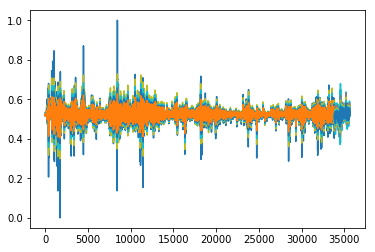

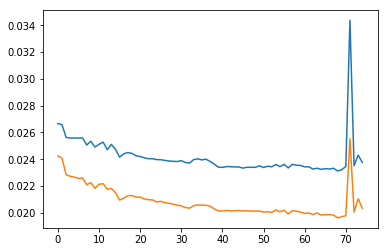

Epoch 1/1
 - 98s - loss: 5.1649e-04
Train Score: 0.02358 RMSE
Test Score: 0.02005 RMSE


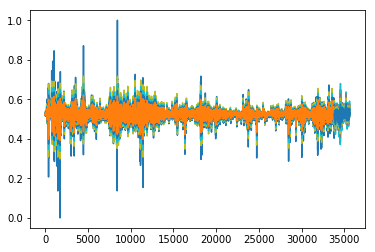

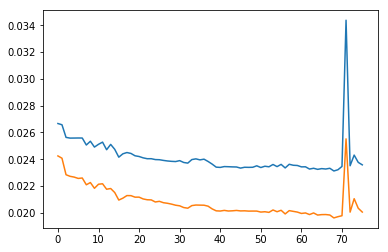

Epoch 1/1
 - 100s - loss: 5.2309e-04
Train Score: 0.02333 RMSE
Test Score: 0.01978 RMSE


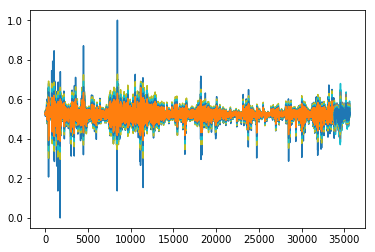

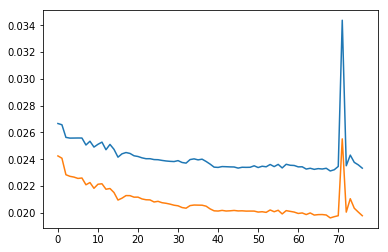

Epoch 1/1
 - 97s - loss: 5.1958e-04
Train Score: 0.02327 RMSE
Test Score: 0.02002 RMSE


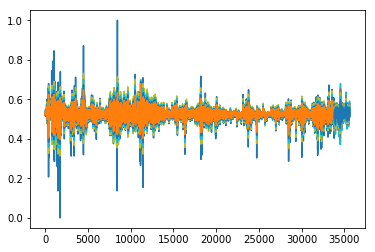

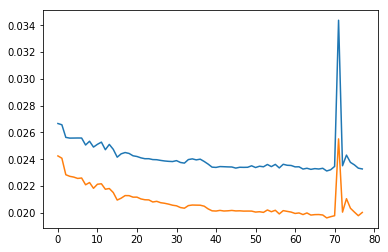

Epoch 1/1
 - 98s - loss: 5.1773e-04
Train Score: 0.02325 RMSE
Test Score: 0.01995 RMSE


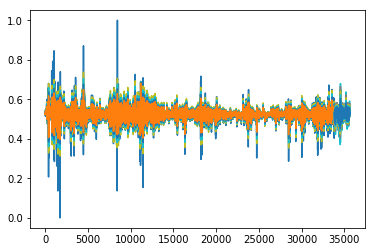

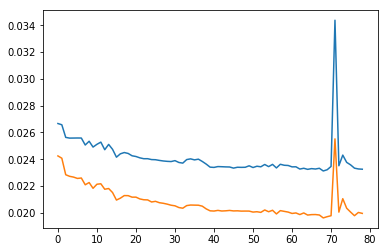

Epoch 1/1
 - 99s - loss: 5.1822e-04
Train Score: 0.02317 RMSE
Test Score: 0.01987 RMSE


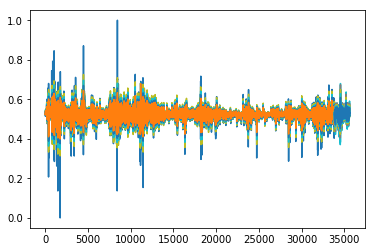

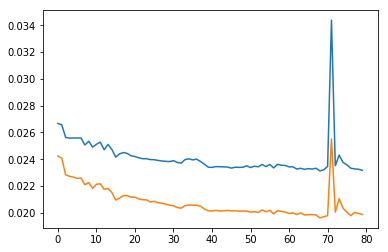

Epoch 1/1
 - 97s - loss: 5.1814e-04
Train Score: 0.02317 RMSE
Test Score: 0.01993 RMSE


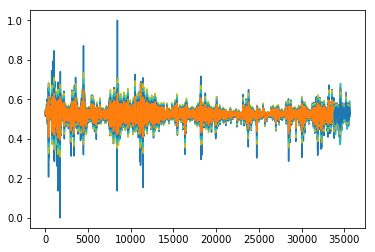

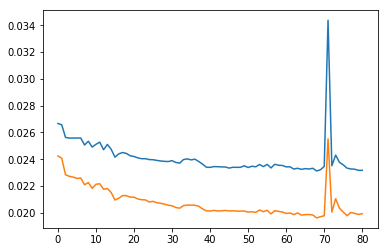

Epoch 1/1
 - 100s - loss: 5.1849e-04
Train Score: 0.02312 RMSE
Test Score: 0.01989 RMSE


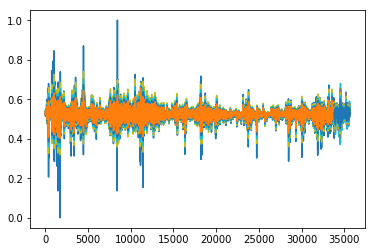

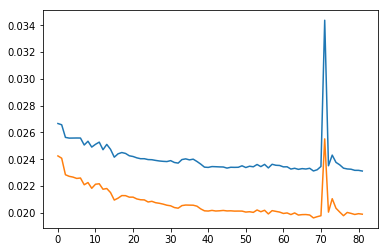

Epoch 1/1
 - 98s - loss: 5.1745e-04
Train Score: 0.02313 RMSE
Test Score: 0.01990 RMSE


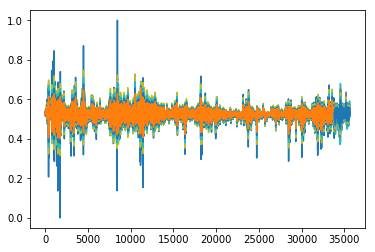

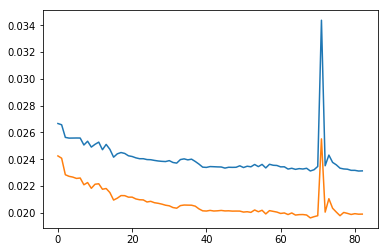

Epoch 1/1
 - 98s - loss: 5.1659e-04
Train Score: 0.02317 RMSE
Test Score: 0.01990 RMSE


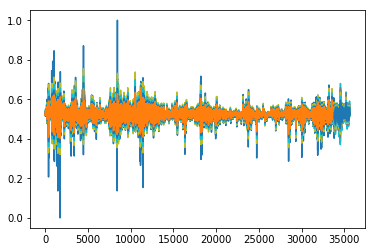

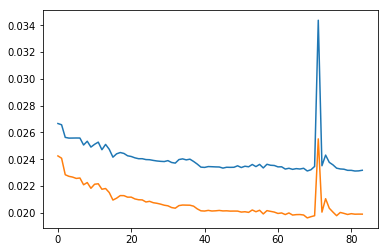

Epoch 1/1
 - 99s - loss: 5.1712e-04
Train Score: 0.02319 RMSE
Test Score: 0.01995 RMSE


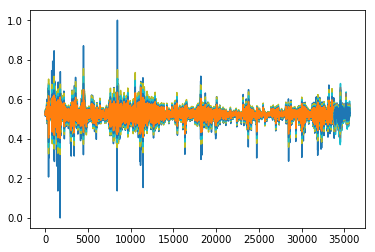

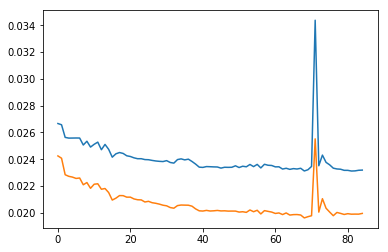

Epoch 1/1
 - 96s - loss: 5.1639e-04
Train Score: 0.02307 RMSE
Test Score: 0.01986 RMSE


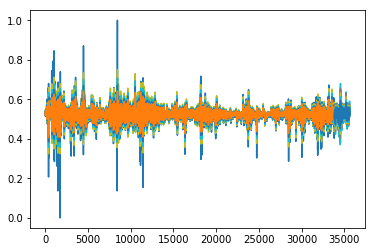

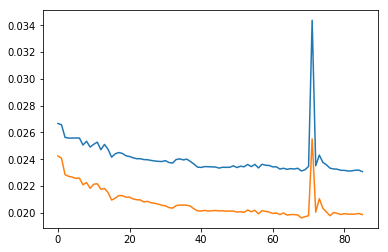

Epoch 1/1
 - 98s - loss: 5.1758e-04
Train Score: 0.02292 RMSE
Test Score: 0.01975 RMSE


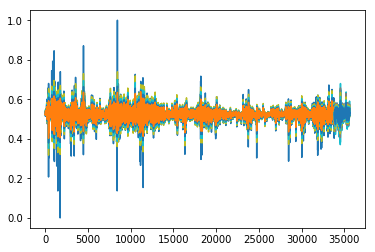

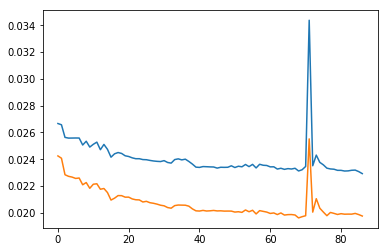

Epoch 1/1
 - 97s - loss: 5.1801e-04
Train Score: 0.02314 RMSE
Test Score: 0.01991 RMSE


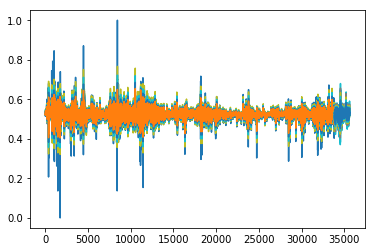

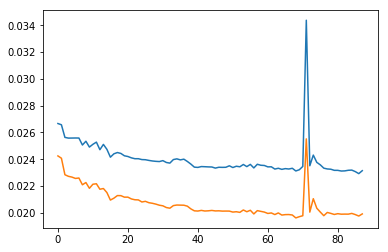

Epoch 1/1
 - 97s - loss: 5.1599e-04
Train Score: 0.02312 RMSE
Test Score: 0.01990 RMSE


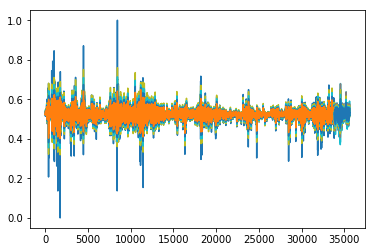

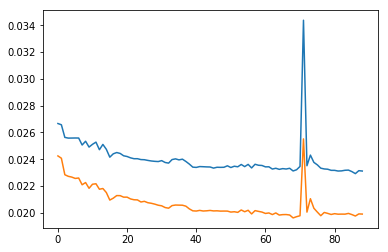

Epoch 1/1
 - 99s - loss: 5.1553e-04
Train Score: 0.02305 RMSE
Test Score: 0.01982 RMSE


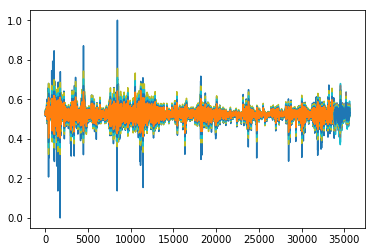

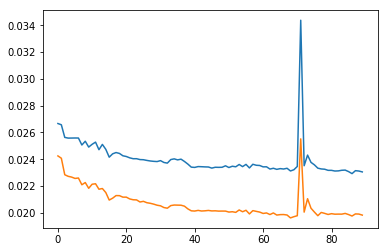

Epoch 1/1
 - 96s - loss: 5.1724e-04
Train Score: 0.02313 RMSE
Test Score: 0.01989 RMSE


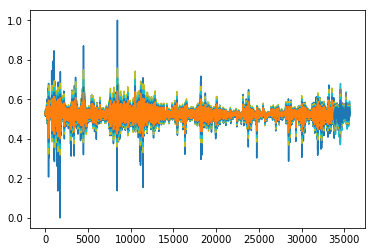

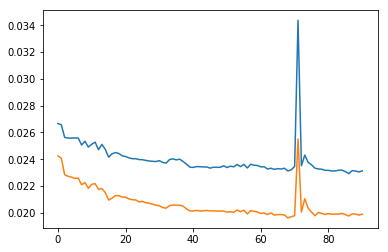

Epoch 1/1
 - 98s - loss: 5.1630e-04
Train Score: 0.02306 RMSE
Test Score: 0.01985 RMSE


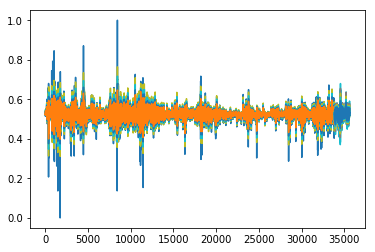

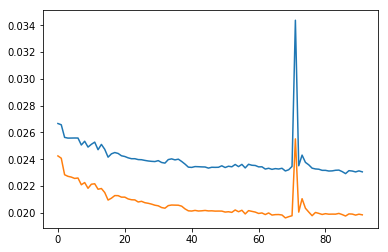

Epoch 1/1
 - 98s - loss: 5.1432e-04
Train Score: 0.02302 RMSE
Test Score: 0.01983 RMSE


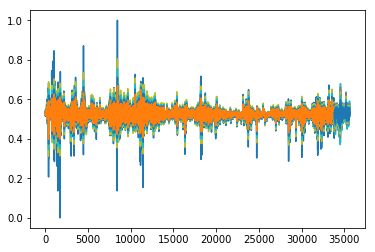

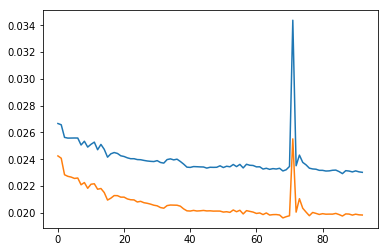

Epoch 1/1
 - 97s - loss: 5.1343e-04
Train Score: 0.02302 RMSE
Test Score: 0.01983 RMSE


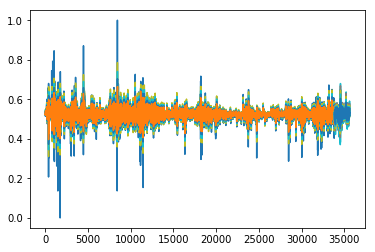

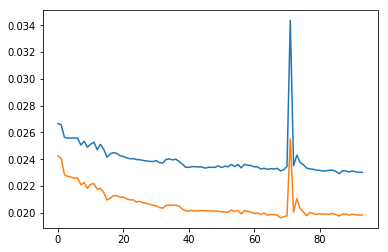

Epoch 1/1
 - 99s - loss: 5.1547e-04
Train Score: 0.02330 RMSE
Test Score: 0.01988 RMSE


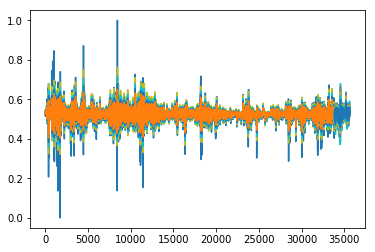

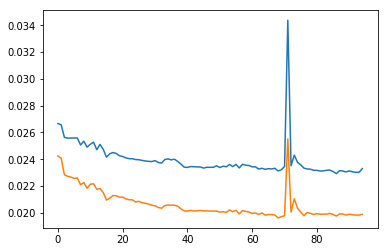

Epoch 1/1
 - 98s - loss: 5.1606e-04
Train Score: 0.02287 RMSE
Test Score: 0.01968 RMSE


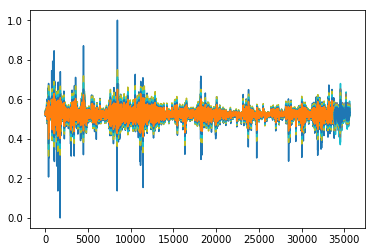

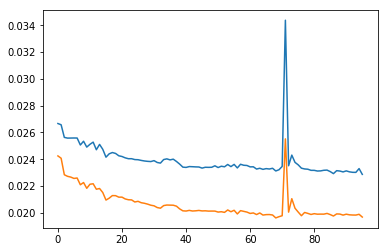

Epoch 1/1
 - 99s - loss: 5.1273e-04
Train Score: 0.02295 RMSE
Test Score: 0.01975 RMSE


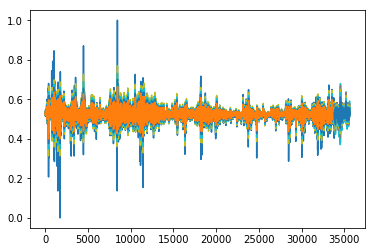

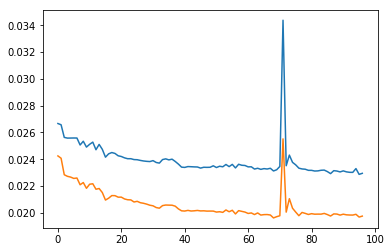

Epoch 1/1
 - 99s - loss: 5.1300e-04
Train Score: 0.02301 RMSE
Test Score: 0.01979 RMSE


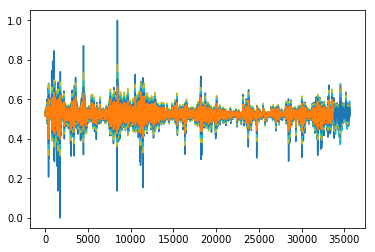

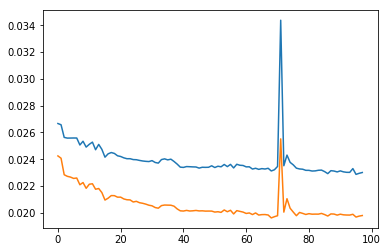

Epoch 1/1
 - 97s - loss: 5.1391e-04
Train Score: 0.02305 RMSE
Test Score: 0.01982 RMSE


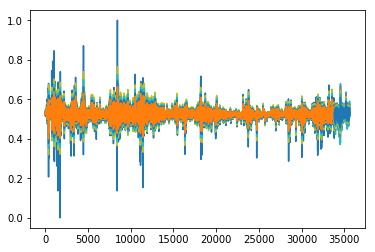

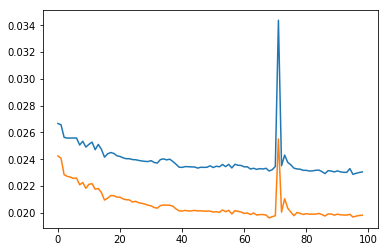

Epoch 1/1
 - 98s - loss: 5.1583e-04
Train Score: 0.02327 RMSE
Test Score: 0.01988 RMSE


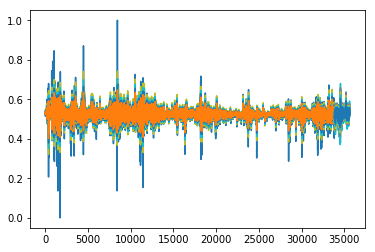

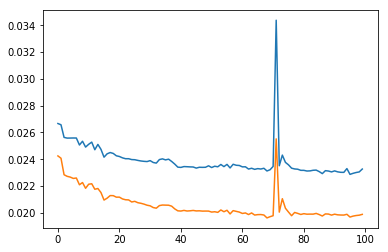

Epoch 1/1
 - 96s - loss: 5.1169e-04
Train Score: 0.02301 RMSE
Test Score: 0.01963 RMSE


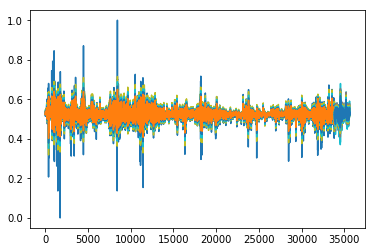

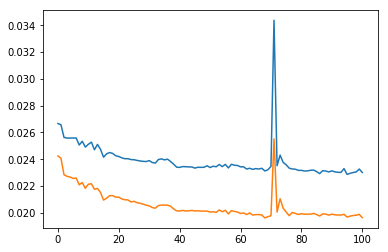

Epoch 1/1
 - 98s - loss: 5.1117e-04
Train Score: 0.02311 RMSE
Test Score: 0.01974 RMSE


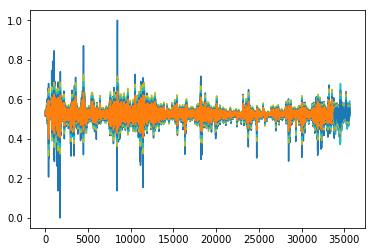

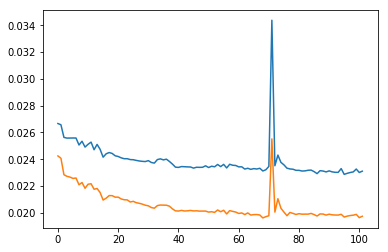

Epoch 1/1
 - 98s - loss: 5.1192e-04
Train Score: 0.02297 RMSE
Test Score: 0.01965 RMSE


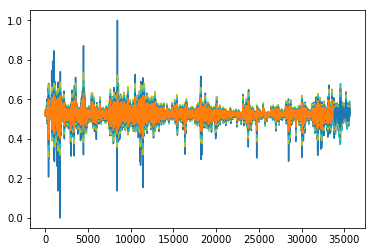

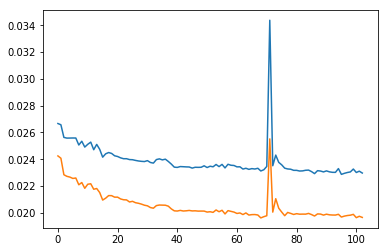

Epoch 1/1
 - 97s - loss: 5.1284e-04
Train Score: 0.02303 RMSE
Test Score: 0.01968 RMSE


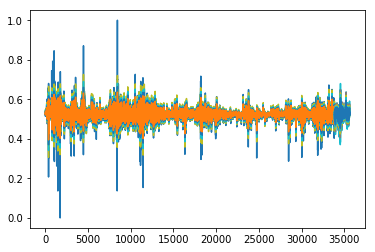

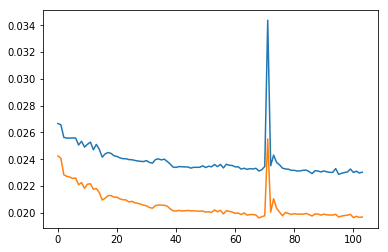

Epoch 1/1
 - 99s - loss: 5.1099e-04
Train Score: 0.02309 RMSE
Test Score: 0.01973 RMSE


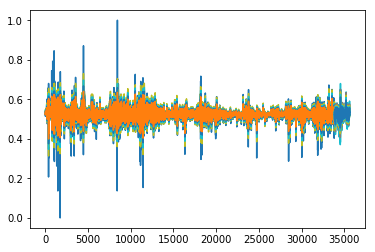

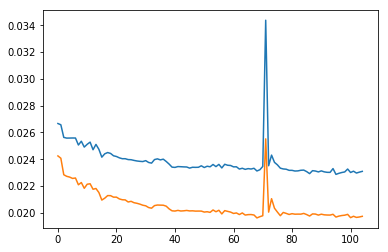

Epoch 1/1
 - 98s - loss: 5.1116e-04
Train Score: 0.02303 RMSE
Test Score: 0.01970 RMSE


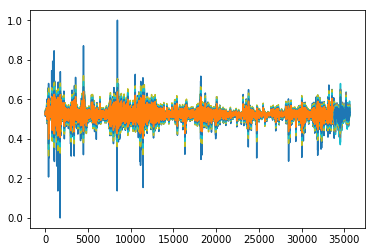

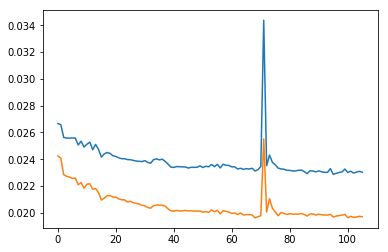

Epoch 1/1
 - 98s - loss: 5.1277e-04
Train Score: 0.02290 RMSE
Test Score: 0.01967 RMSE


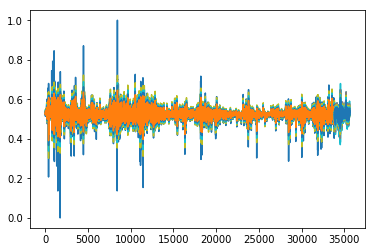

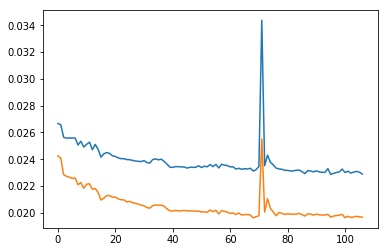

Epoch 1/1
 - 99s - loss: 5.1216e-04
Train Score: 0.02292 RMSE
Test Score: 0.01966 RMSE


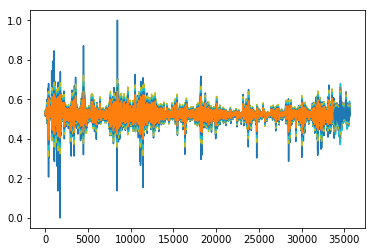

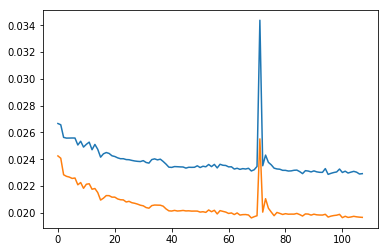

Epoch 1/1
 - 98s - loss: 5.1318e-04
Train Score: 0.02294 RMSE
Test Score: 0.01968 RMSE


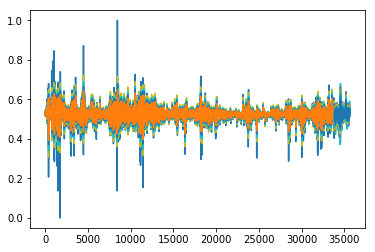

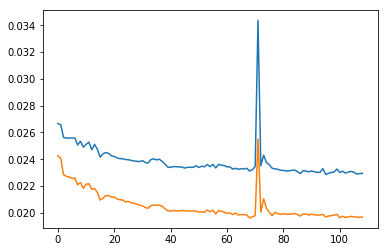

Epoch 1/1
 - 101s - loss: 5.1229e-04
Train Score: 0.02298 RMSE
Test Score: 0.01973 RMSE


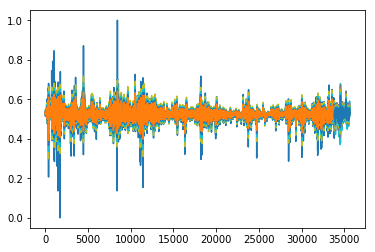

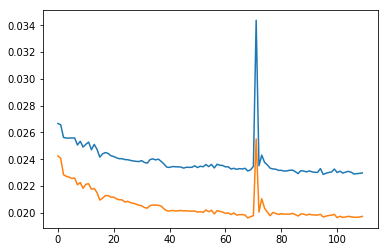

Epoch 1/1
 - 98s - loss: 5.1578e-04
Train Score: 0.02293 RMSE
Test Score: 0.01967 RMSE


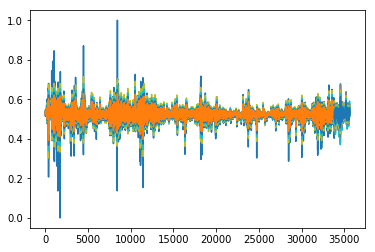

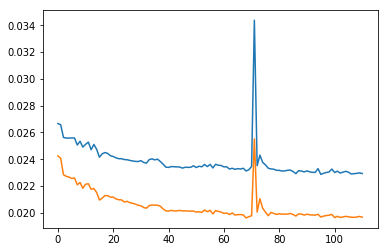

Epoch 1/1
 - 98s - loss: 5.1301e-04
Train Score: 0.02296 RMSE
Test Score: 0.01967 RMSE


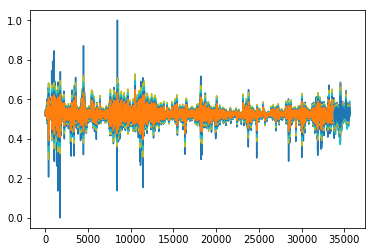

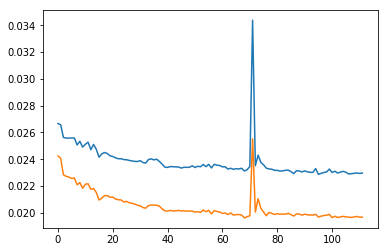

Epoch 1/1
 - 100s - loss: 5.1925e-04
Train Score: 0.02293 RMSE
Test Score: 0.01975 RMSE


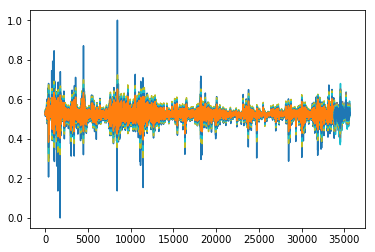

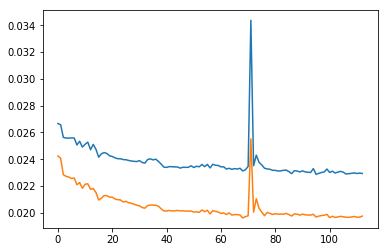

Epoch 1/1
 - 97s - loss: 5.1693e-04
Train Score: 0.02298 RMSE
Test Score: 0.01968 RMSE


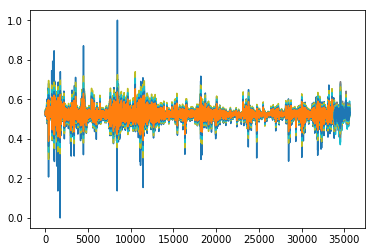

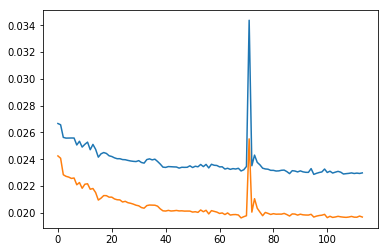

Epoch 1/1
 - 98s - loss: 5.1479e-04
Train Score: 0.02295 RMSE
Test Score: 0.01973 RMSE


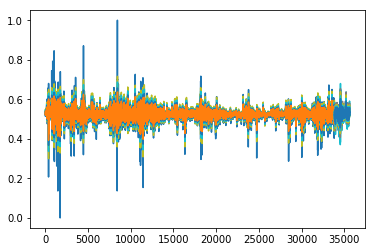

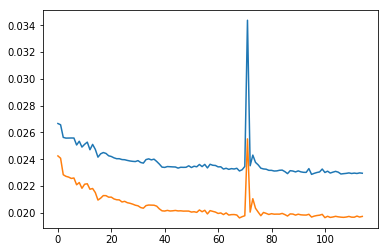

Epoch 1/1
 - 99s - loss: 5.1409e-04
Train Score: 0.02304 RMSE
Test Score: 0.01977 RMSE


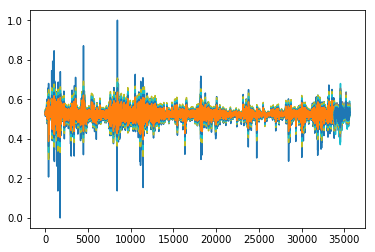

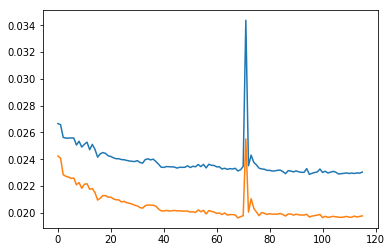

Epoch 1/1
 - 97s - loss: 5.1916e-04
Train Score: 0.02297 RMSE
Test Score: 0.01977 RMSE


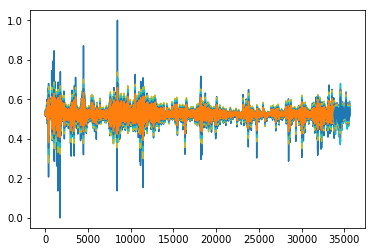

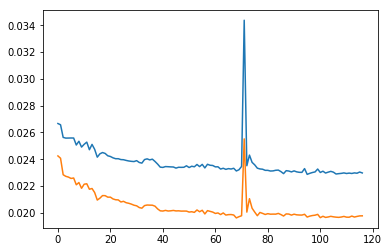

Epoch 1/1
 - 99s - loss: 5.1517e-04
Train Score: 0.02292 RMSE
Test Score: 0.01966 RMSE


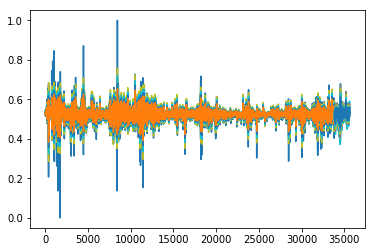

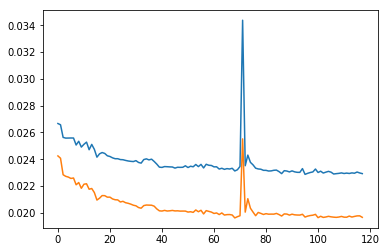

Epoch 1/1
 - 98s - loss: 5.1680e-04
Train Score: 0.02291 RMSE
Test Score: 0.01970 RMSE


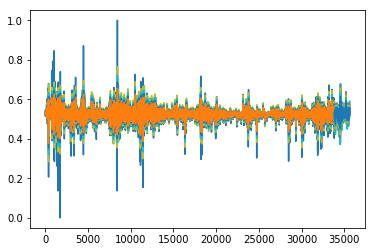

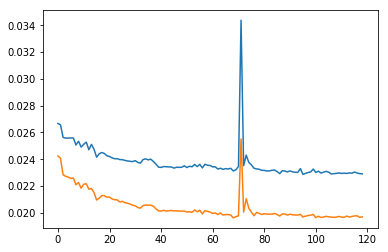

Epoch 1/1
 - 98s - loss: 5.1631e-04
Train Score: 0.02291 RMSE
Test Score: 0.01972 RMSE


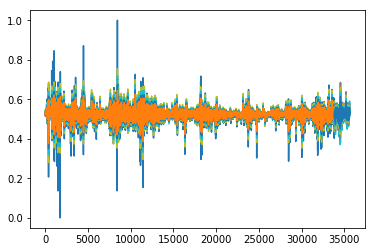

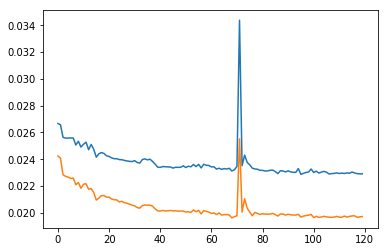

Epoch 1/1
 - 99s - loss: 5.1498e-04
Train Score: 0.02298 RMSE
Test Score: 0.01987 RMSE


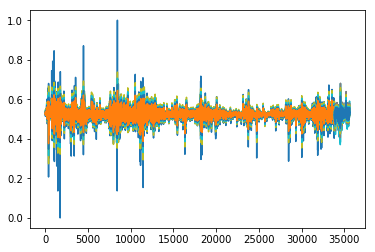

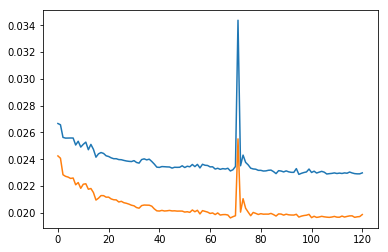

Epoch 1/1
 - 97s - loss: 5.1475e-04
Train Score: 0.02310 RMSE
Test Score: 0.01980 RMSE


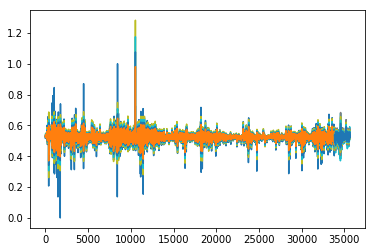

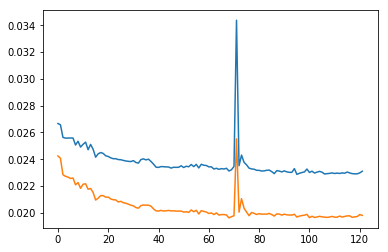

Epoch 1/1
 - 99s - loss: 5.1471e-04
Train Score: 0.02295 RMSE
Test Score: 0.01988 RMSE


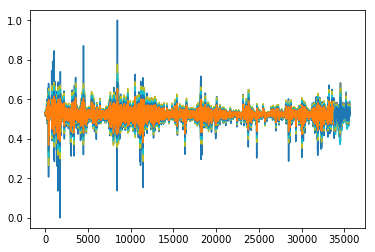

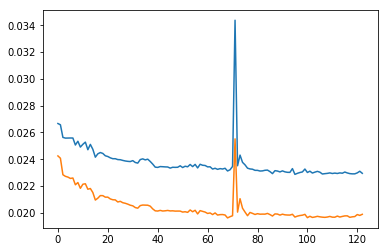

Epoch 1/1
 - 98s - loss: 5.1577e-04
Train Score: 0.02289 RMSE
Test Score: 0.01981 RMSE


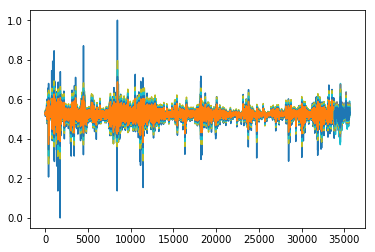

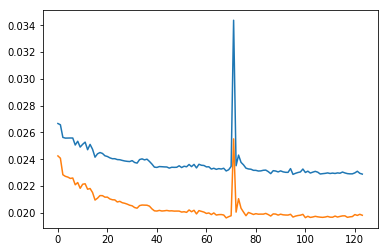

Epoch 1/1
 - 98s - loss: 5.1276e-04
Train Score: 0.02292 RMSE
Test Score: 0.01981 RMSE


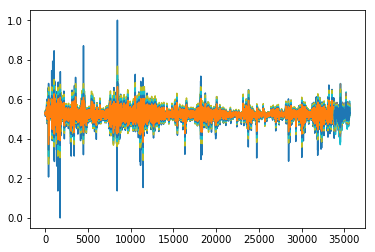

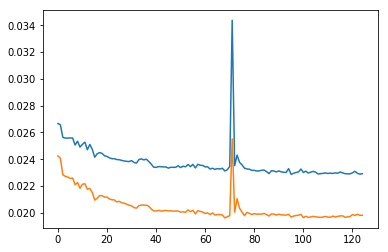

Epoch 1/1
 - 100s - loss: 5.1509e-04
Train Score: 0.02284 RMSE
Test Score: 0.01975 RMSE


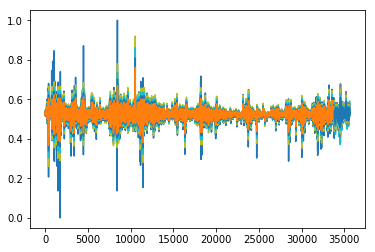

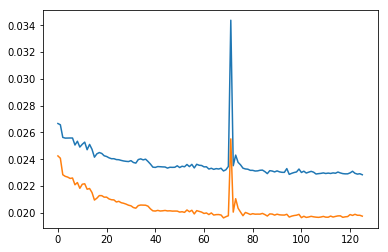

Epoch 1/1
 - 98s - loss: 5.1487e-04
Train Score: 0.02289 RMSE
Test Score: 0.01975 RMSE


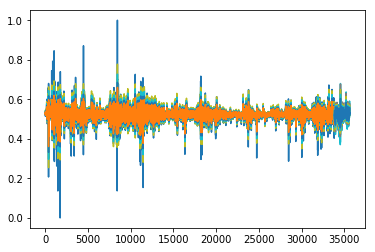

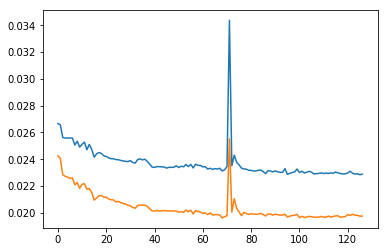

Epoch 1/1
 - 98s - loss: 5.1271e-04
Train Score: 0.02291 RMSE
Test Score: 0.01982 RMSE


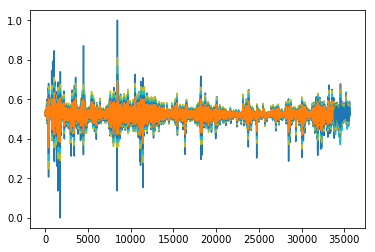

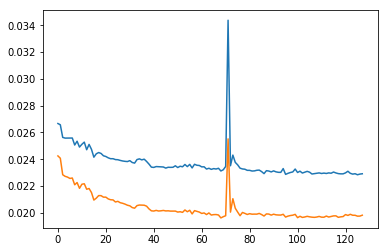

Epoch 1/1
 - 98s - loss: 5.1075e-04
Train Score: 0.02288 RMSE
Test Score: 0.01975 RMSE


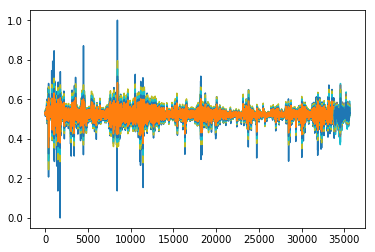

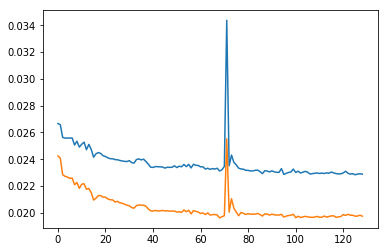

Epoch 1/1
 - 97s - loss: 5.1194e-04
Train Score: 0.02286 RMSE
Test Score: 0.01980 RMSE


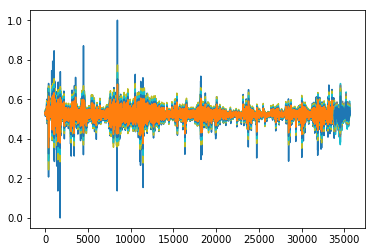

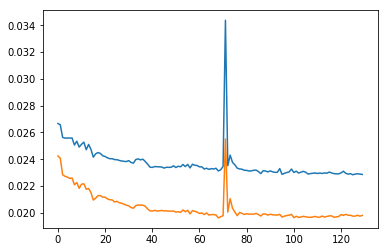

Epoch 1/1
 - 100s - loss: 5.0853e-04
Train Score: 0.02282 RMSE
Test Score: 0.01975 RMSE


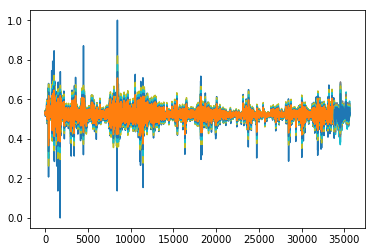

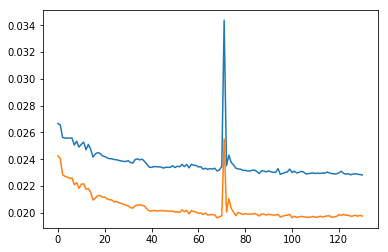

Epoch 1/1
 - 99s - loss: 5.0866e-04
Train Score: 0.02285 RMSE
Test Score: 0.01976 RMSE


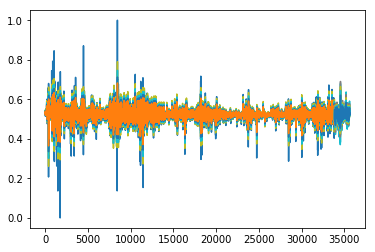

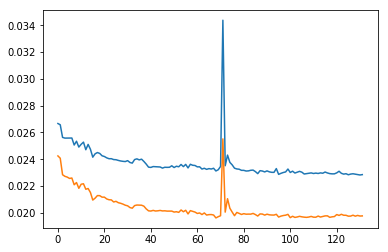

Epoch 1/1
 - 99s - loss: 5.1005e-04
Train Score: 0.02294 RMSE
Test Score: 0.01985 RMSE


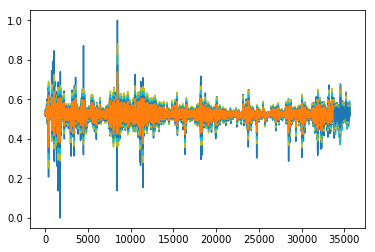

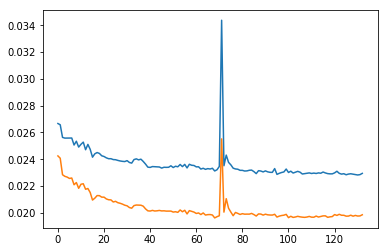

Epoch 1/1
 - 99s - loss: 5.1527e-04
Train Score: 0.02293 RMSE
Test Score: 0.01985 RMSE


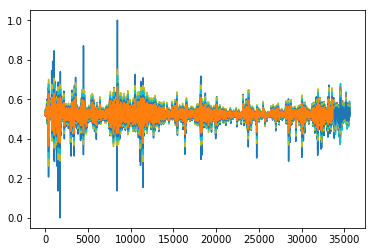

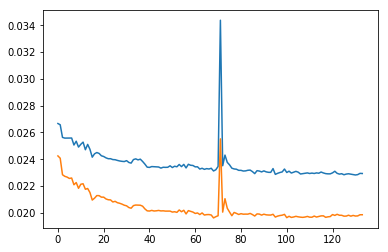

Epoch 1/1
 - 97s - loss: 5.0916e-04
Train Score: 0.02283 RMSE
Test Score: 0.01970 RMSE


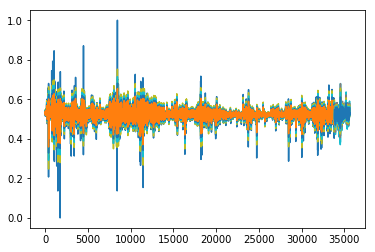

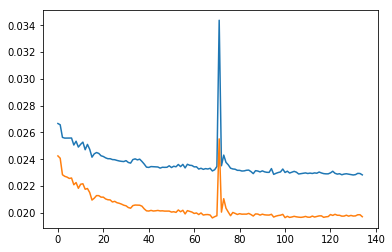

Epoch 1/1
 - 99s - loss: 5.0976e-04
Train Score: 0.02304 RMSE
Test Score: 0.01982 RMSE


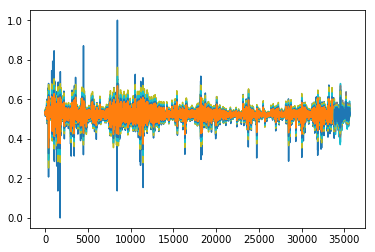

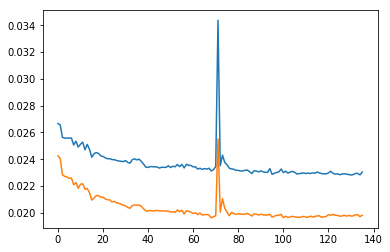

Epoch 1/1
 - 99s - loss: 5.0659e-04
Train Score: 0.02278 RMSE
Test Score: 0.01975 RMSE


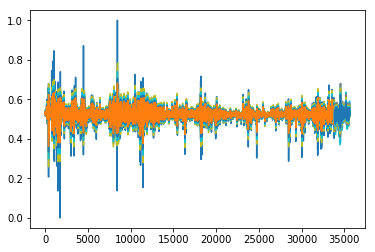

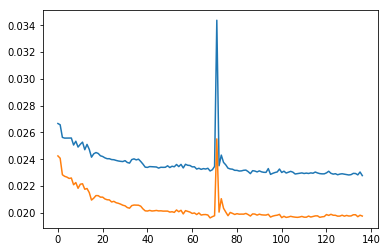

Epoch 1/1
 - 98s - loss: 5.0894e-04
Train Score: 0.02296 RMSE
Test Score: 0.01982 RMSE


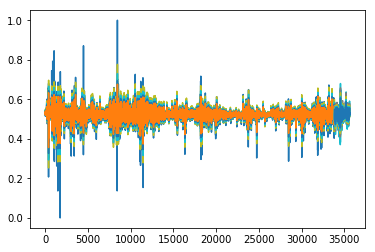

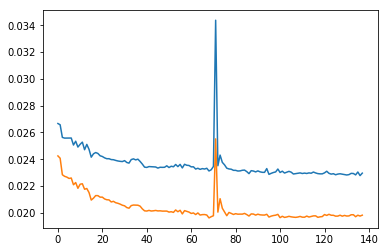

Epoch 1/1
 - 100s - loss: 5.0666e-04
Train Score: 0.02290 RMSE
Test Score: 0.01987 RMSE


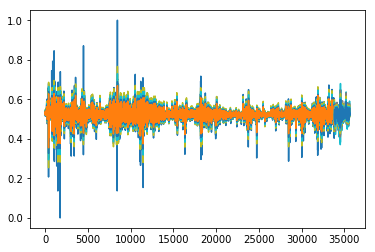

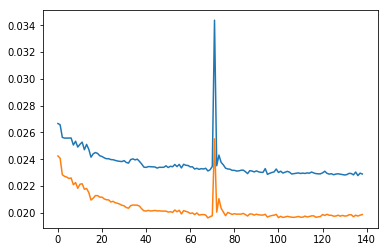

Epoch 1/1
 - 98s - loss: 5.0818e-04
Train Score: 0.02286 RMSE
Test Score: 0.01987 RMSE


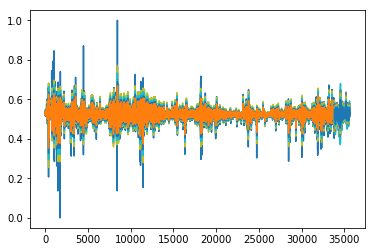

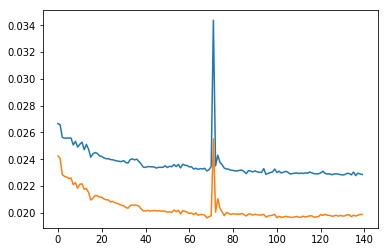

Epoch 1/1
 - 99s - loss: 5.0784e-04
Train Score: 0.02287 RMSE
Test Score: 0.01987 RMSE


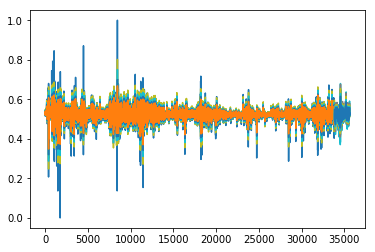

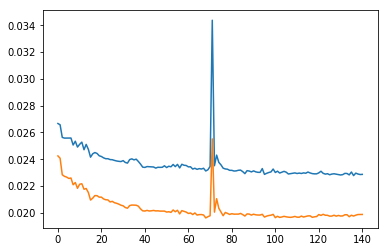

Epoch 1/1
 - 99s - loss: 5.0737e-04
Train Score: 0.02285 RMSE
Test Score: 0.01988 RMSE


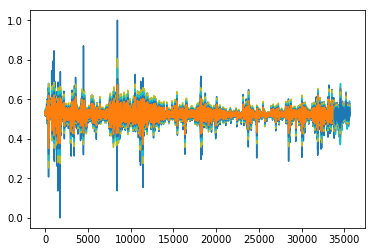

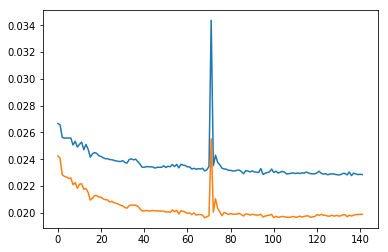

Epoch 1/1
 - 98s - loss: 5.0687e-04
Train Score: 0.02286 RMSE
Test Score: 0.01988 RMSE


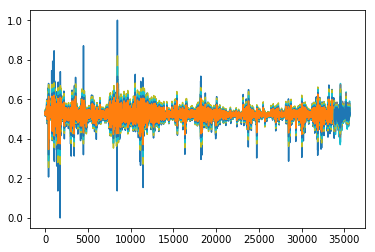

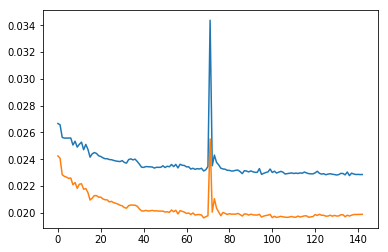

Epoch 1/1
 - 99s - loss: 5.0753e-04
Train Score: 0.02279 RMSE
Test Score: 0.01984 RMSE


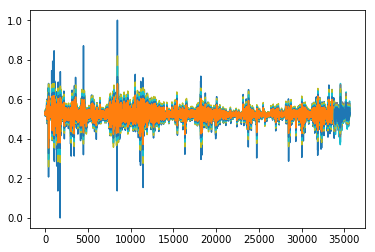

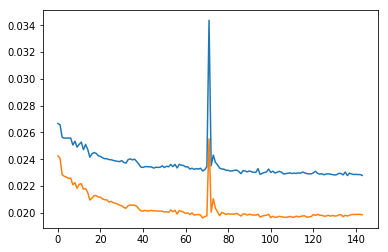

Epoch 1/1
 - 98s - loss: 5.0986e-04
Train Score: 0.02279 RMSE
Test Score: 0.01985 RMSE


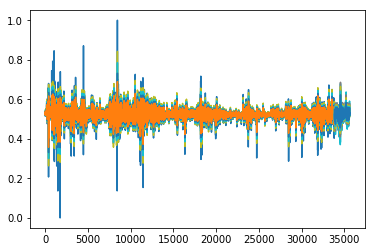

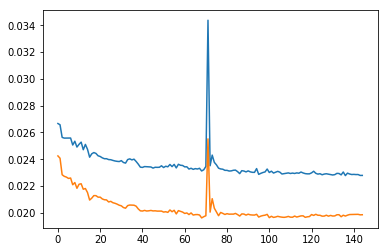

Epoch 1/1
 - 98s - loss: 5.0880e-04
Train Score: 0.02284 RMSE
Test Score: 0.01990 RMSE


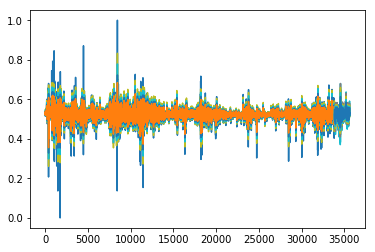

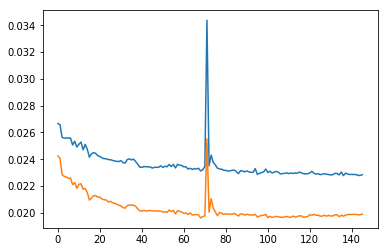

Epoch 1/1
 - 100s - loss: 5.0430e-04
Train Score: 0.02281 RMSE
Test Score: 0.01982 RMSE


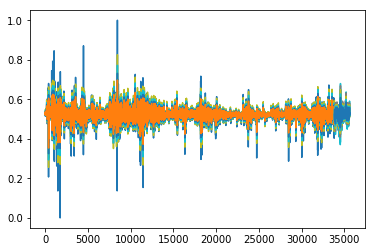

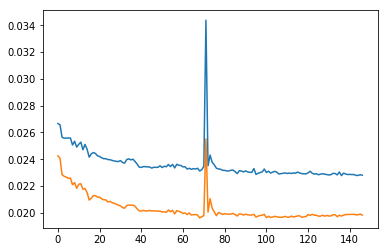

Epoch 1/1
 - 98s - loss: 5.0258e-04
Train Score: 0.02276 RMSE
Test Score: 0.01979 RMSE


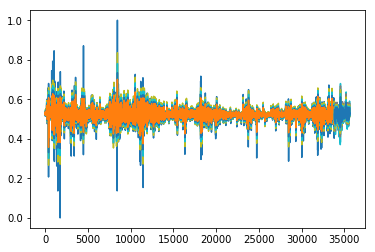

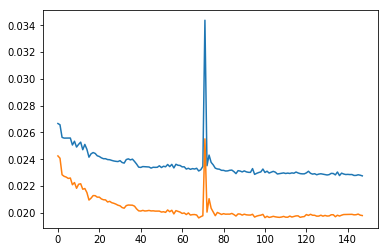

Epoch 1/1
 - 99s - loss: 5.1252e-04
Train Score: 0.02275 RMSE
Test Score: 0.01974 RMSE


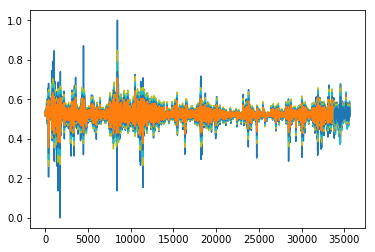

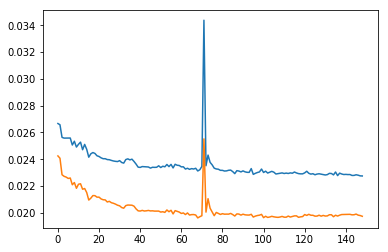

Epoch 1/1
 - 97s - loss: 5.1064e-04
Train Score: 0.02274 RMSE
Test Score: 0.01970 RMSE


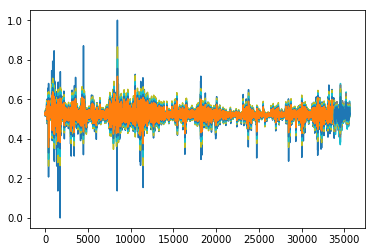

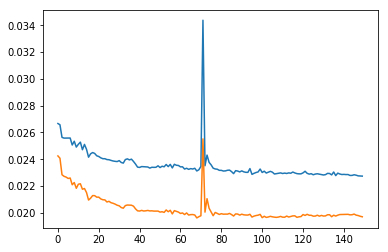

Epoch 1/1
 - 97s - loss: 5.0756e-04
Train Score: 0.02271 RMSE
Test Score: 0.01968 RMSE


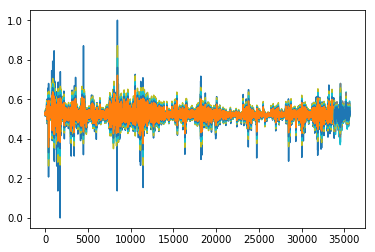

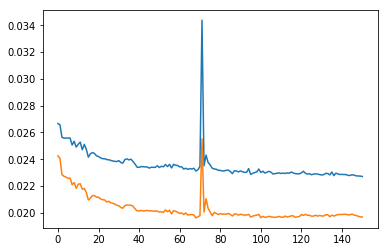

Epoch 1/1
 - 98s - loss: 5.0865e-04
Train Score: 0.02271 RMSE
Test Score: 0.01968 RMSE


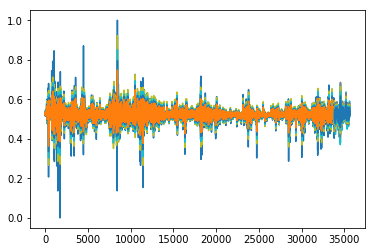

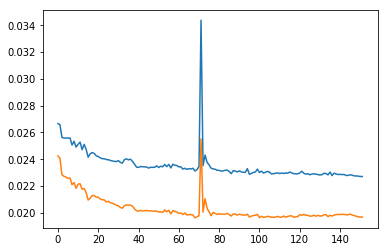

Epoch 1/1
 - 99s - loss: 5.1164e-04
Train Score: 0.02265 RMSE
Test Score: 0.01957 RMSE


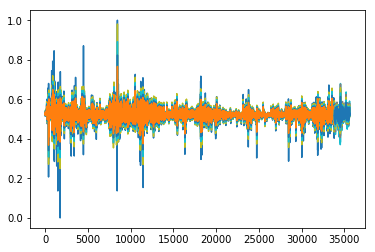

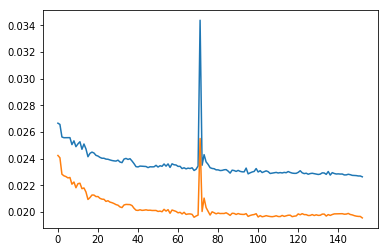

Epoch 1/1
 - 98s - loss: 5.1265e-04
Train Score: 0.02286 RMSE
Test Score: 0.01970 RMSE


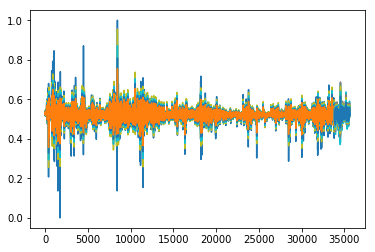

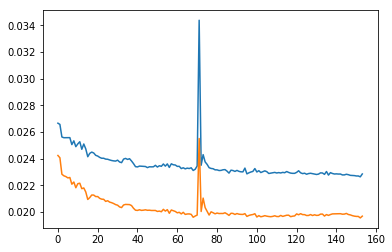

Epoch 1/1
 - 100s - loss: 5.1076e-04
Train Score: 0.02281 RMSE
Test Score: 0.01972 RMSE


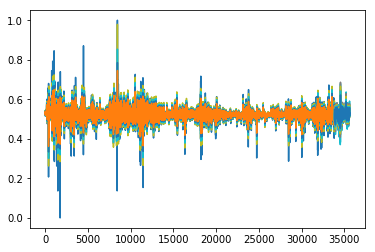

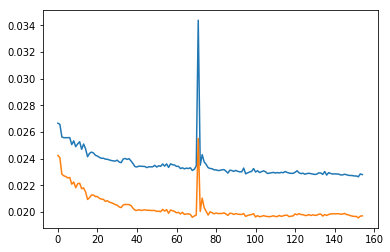

Epoch 1/1
 - 98s - loss: 5.1192e-04
Train Score: 0.02274 RMSE
Test Score: 0.01971 RMSE


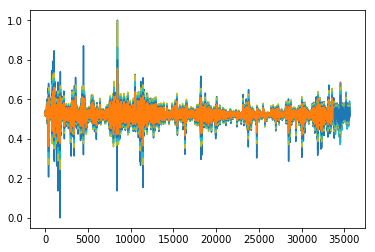

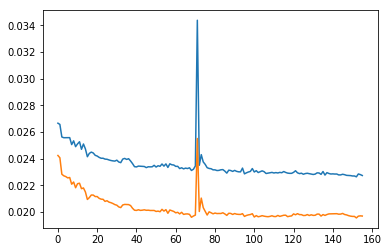

Epoch 1/1
 - 98s - loss: 5.0363e-04
Train Score: 0.02273 RMSE
Test Score: 0.01970 RMSE


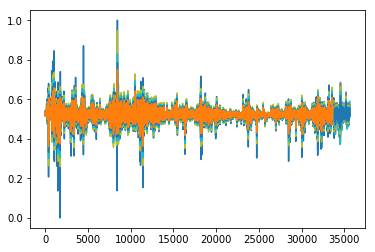

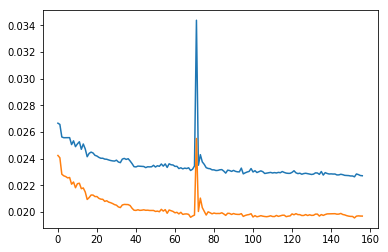

Epoch 1/1
 - 99s - loss: 5.0471e-04
Train Score: 0.02301 RMSE
Test Score: 0.01983 RMSE


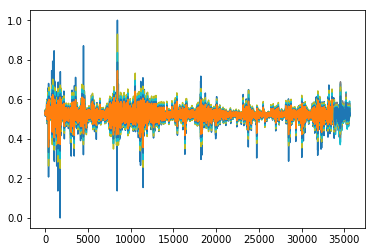

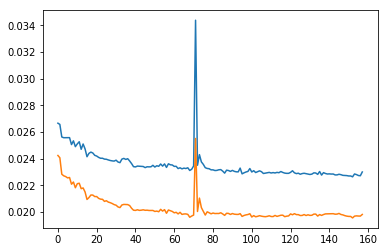

Epoch 1/1
 - 97s - loss: 5.0311e-04
Train Score: 0.02273 RMSE
Test Score: 0.01975 RMSE


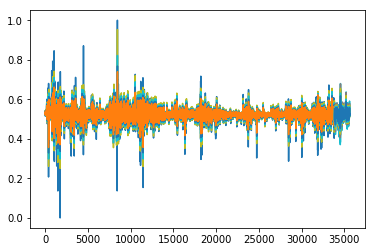

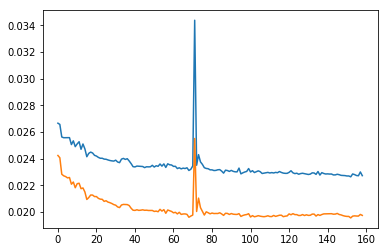

Epoch 1/1
 - 98s - loss: 5.0231e-04
Train Score: 0.02276 RMSE
Test Score: 0.01979 RMSE


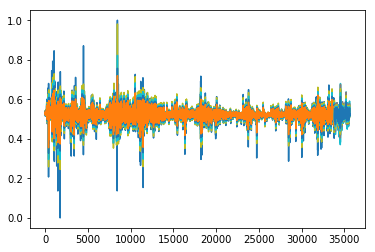

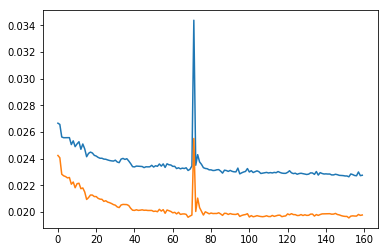

Epoch 1/1
 - 99s - loss: 5.0525e-04
Train Score: 0.02305 RMSE
Test Score: 0.01992 RMSE


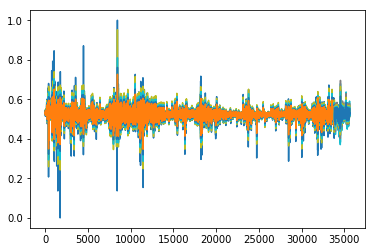

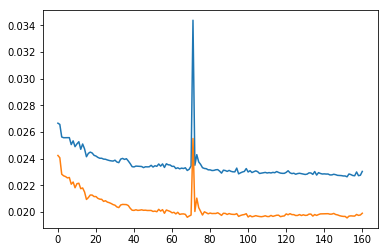

Epoch 1/1
 - 97s - loss: 5.0410e-04
Train Score: 0.02291 RMSE
Test Score: 0.01992 RMSE


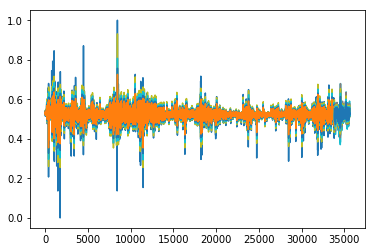

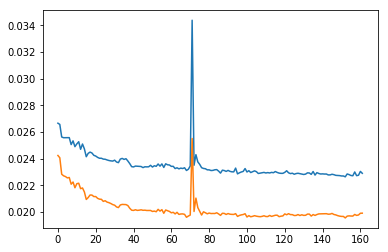

Epoch 1/1
 - 100s - loss: 5.0647e-04
Train Score: 0.02312 RMSE
Test Score: 0.02000 RMSE


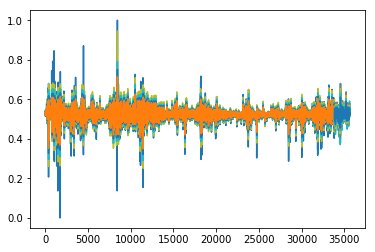

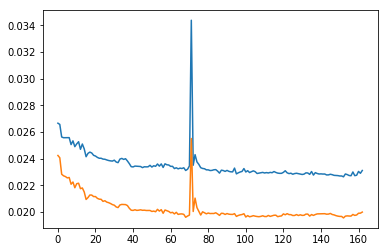

Epoch 1/1
 - 98s - loss: 7.4715e-04
Train Score: 0.02495 RMSE
Test Score: 0.03347 RMSE


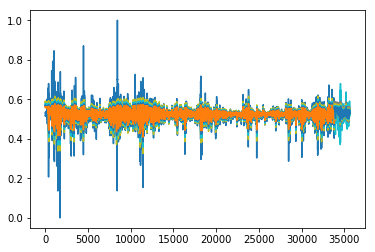

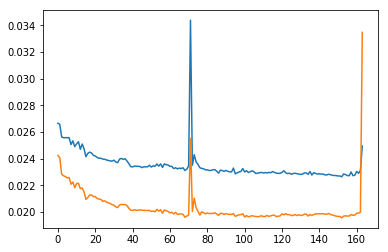

Epoch 1/1
 - 99s - loss: 5.6954e-04
Train Score: 0.02428 RMSE
Test Score: 0.02190 RMSE


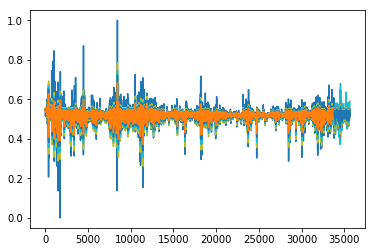

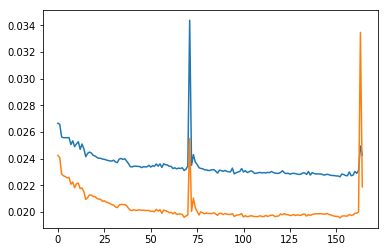

Epoch 1/1
 - 101s - loss: 5.3579e-04
Train Score: 0.03371 RMSE
Test Score: 0.02265 RMSE


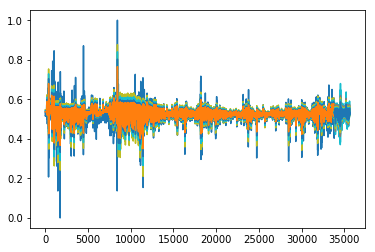

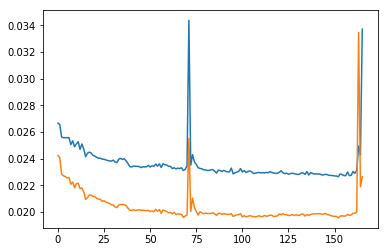

Epoch 1/1
 - 98s - loss: 5.4085e-04
Train Score: 0.02439 RMSE
Test Score: 0.02451 RMSE


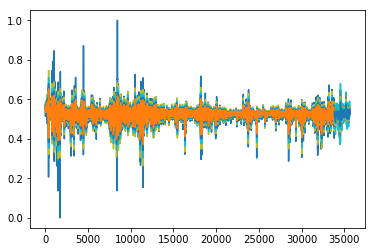

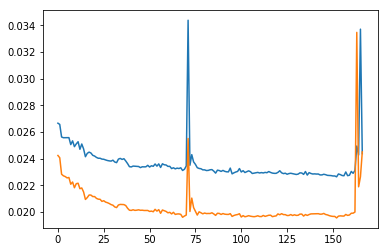

Epoch 1/1
 - 100s - loss: 5.3741e-04
Train Score: 0.02458 RMSE
Test Score: 0.02103 RMSE


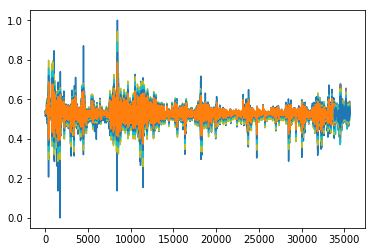

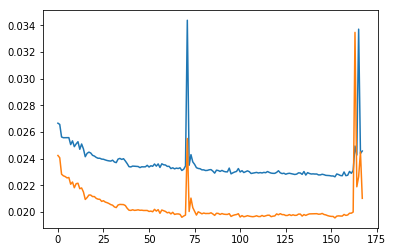

Epoch 1/1
 - 100s - loss: 5.5100e-04
Train Score: 0.02511 RMSE
Test Score: 0.02920 RMSE


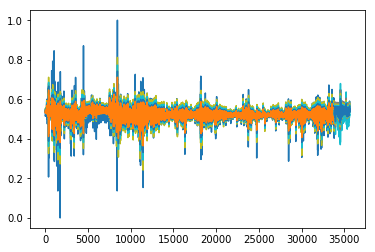

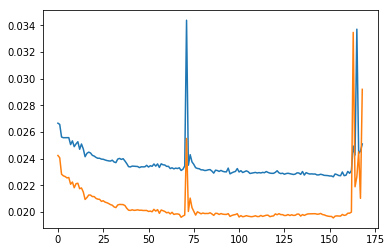

Epoch 1/1
 - 98s - loss: 5.4619e-04
Train Score: 0.02395 RMSE
Test Score: 0.02185 RMSE


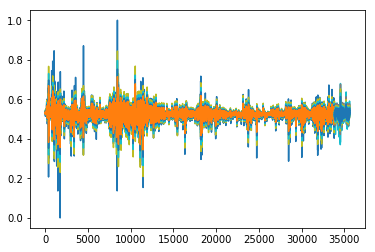

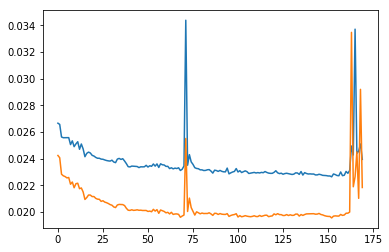

Epoch 1/1
 - 100s - loss: 5.2918e-04
Train Score: 0.02390 RMSE
Test Score: 0.02324 RMSE


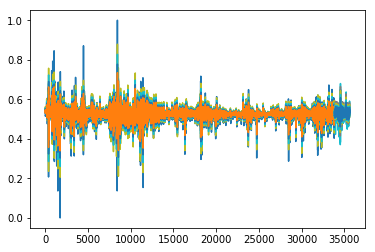

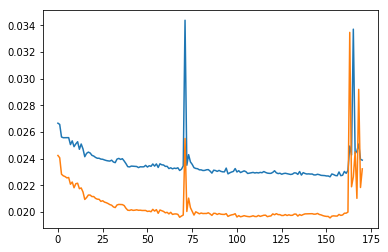

Epoch 1/1
 - 98s - loss: 5.2625e-04
Train Score: 0.02433 RMSE
Test Score: 0.02473 RMSE


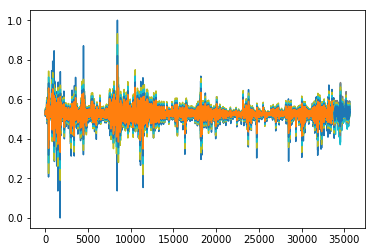

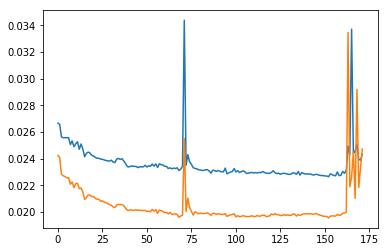

Epoch 1/1
 - 99s - loss: 5.2628e-04
Train Score: 0.02317 RMSE
Test Score: 0.02551 RMSE


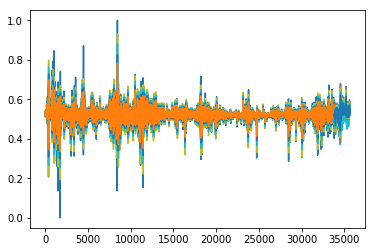

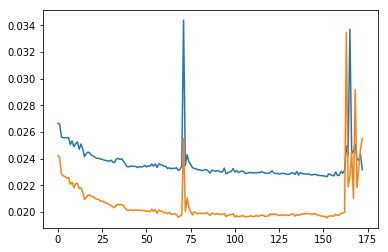

Epoch 1/1
 - 100s - loss: 5.3143e-04
Train Score: 0.02407 RMSE
Test Score: 0.02028 RMSE


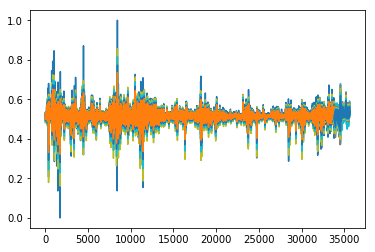

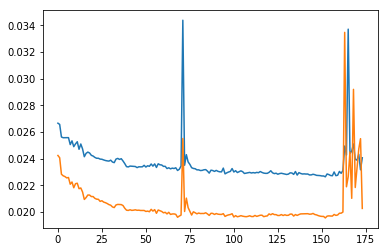

Epoch 1/1
 - 99s - loss: 5.3291e-04
Train Score: 0.02855 RMSE
Test Score: 0.02548 RMSE


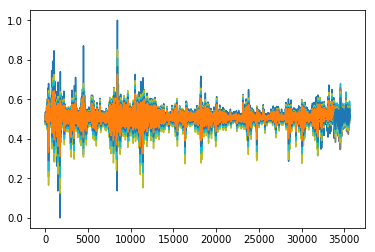

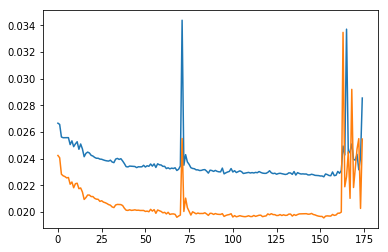

Epoch 1/1
 - 101s - loss: 5.4742e-04
Train Score: 0.02902 RMSE
Test Score: 0.02796 RMSE


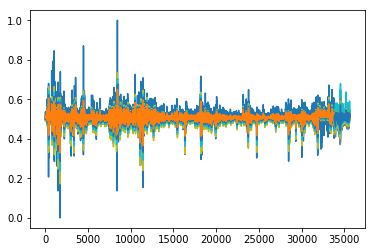

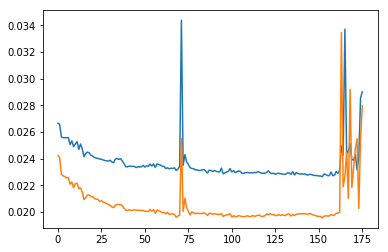

Epoch 1/1
 - 99s - loss: 5.3801e-04
Train Score: 0.02777 RMSE
Test Score: 0.02562 RMSE


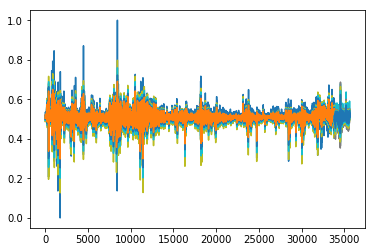

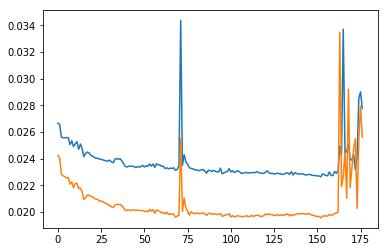

Epoch 1/1
 - 99s - loss: 5.4020e-04
Train Score: 0.02375 RMSE
Test Score: 0.02160 RMSE


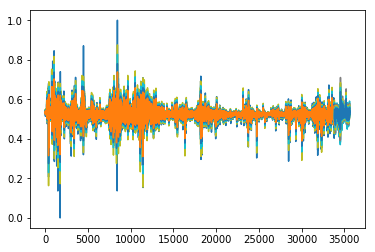

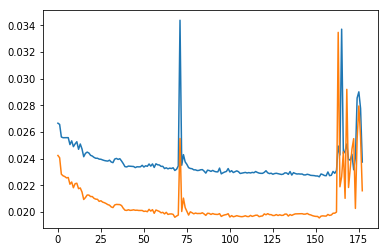

Epoch 1/1
 - 100s - loss: 5.3323e-04
Train Score: 0.02371 RMSE
Test Score: 0.03458 RMSE


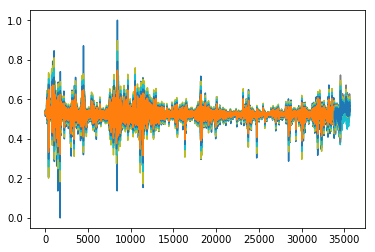

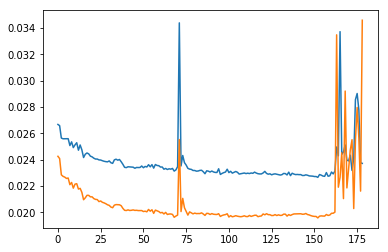

Epoch 1/1
 - 100s - loss: 5.3143e-04
Train Score: 0.02349 RMSE
Test Score: 0.01962 RMSE


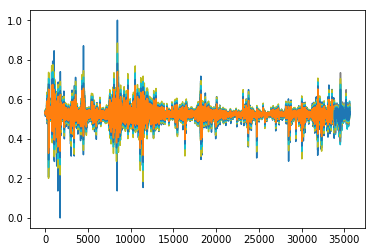

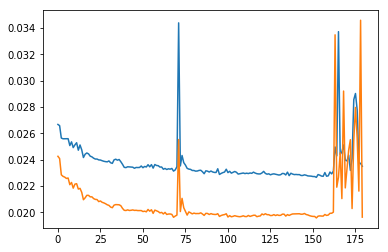

Epoch 1/1
 - 99s - loss: 5.2341e-04
Train Score: 0.02335 RMSE
Test Score: 0.01950 RMSE


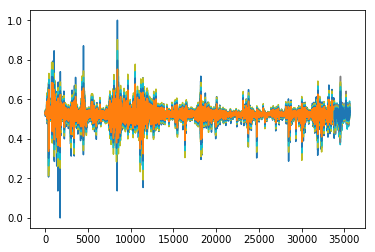

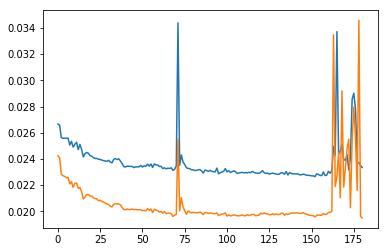

Epoch 1/1
 - 101s - loss: 5.1947e-04
Train Score: 0.02337 RMSE
Test Score: 0.01947 RMSE


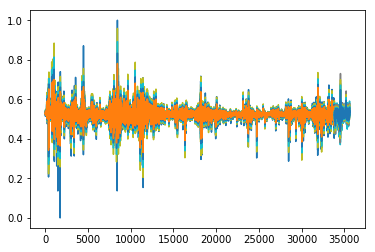

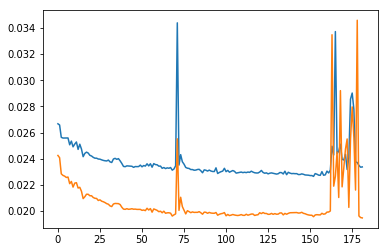

Epoch 1/1
 - 99s - loss: 5.1819e-04
Train Score: 0.02326 RMSE
Test Score: 0.01943 RMSE


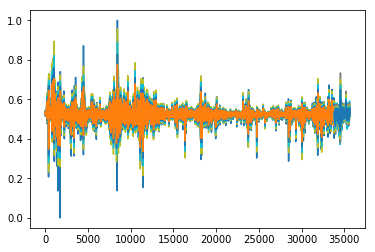

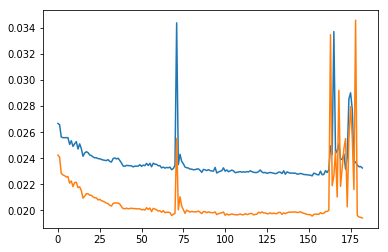

Epoch 1/1
 - 99s - loss: 5.1782e-04
Train Score: 0.02321 RMSE
Test Score: 0.01939 RMSE


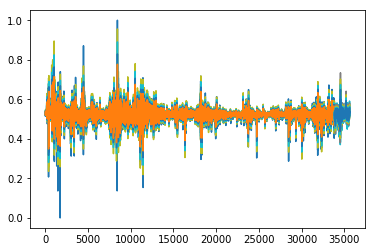

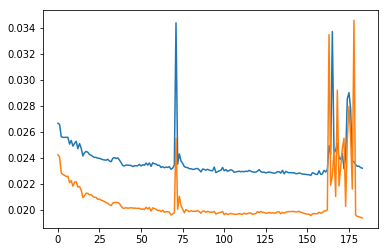

Epoch 1/1
 - 100s - loss: 5.1626e-04
Train Score: 0.02309 RMSE
Test Score: 0.01940 RMSE


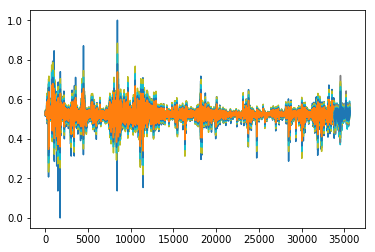

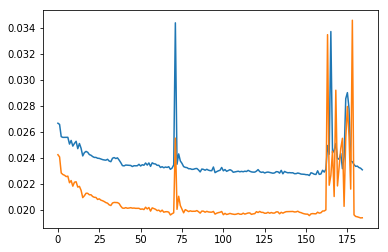

Epoch 1/1
 - 98s - loss: 5.1292e-04
Train Score: 0.02322 RMSE
Test Score: 0.01936 RMSE


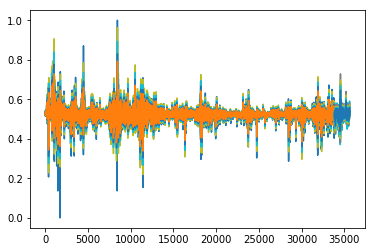

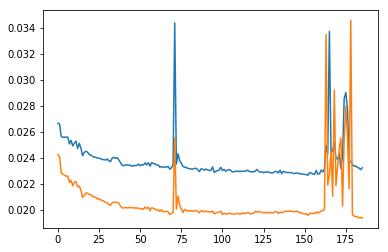

Epoch 1/1
 - 100s - loss: 5.1242e-04
Train Score: 0.02328 RMSE
Test Score: 0.01935 RMSE


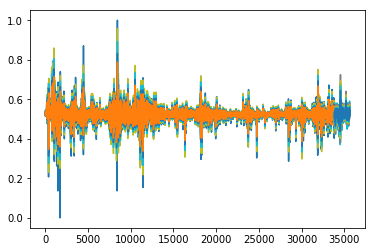

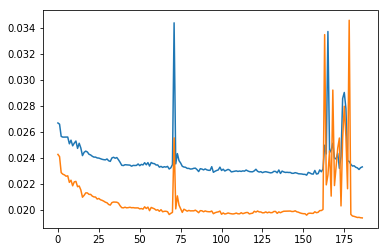

Epoch 1/1
 - 98s - loss: 5.2166e-04
Train Score: 0.02313 RMSE
Test Score: 0.01940 RMSE


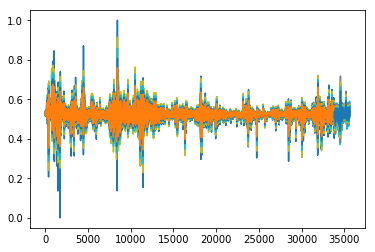

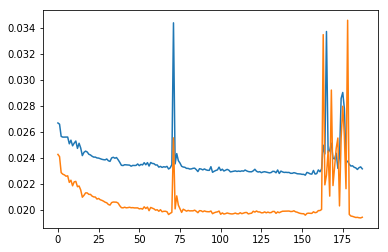

Epoch 1/1
 - 99s - loss: 5.3846e-04
Train Score: 0.02315 RMSE
Test Score: 0.01939 RMSE


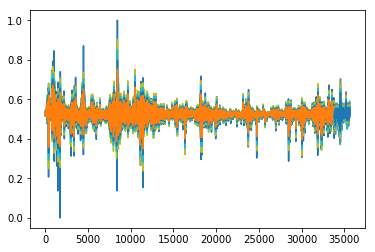

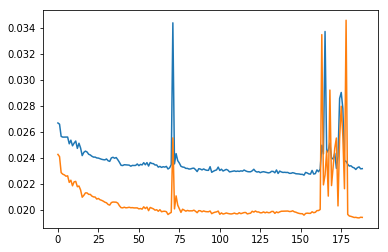

Epoch 1/1
 - 101s - loss: 5.3883e-04
Train Score: 0.03600 RMSE
Test Score: 0.01940 RMSE


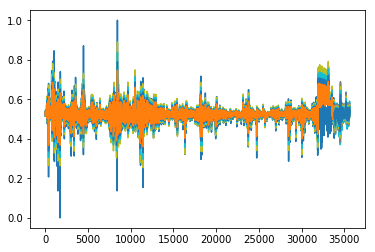

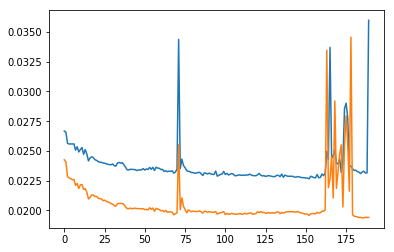

Epoch 1/1
 - 99s - loss: 5.1228e-04
Train Score: 0.03632 RMSE
Test Score: 0.01943 RMSE


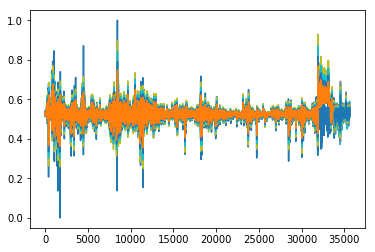

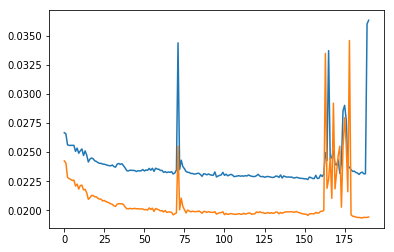

Epoch 1/1
 - 101s - loss: 5.1303e-04
Train Score: 0.03916 RMSE
Test Score: 0.01948 RMSE


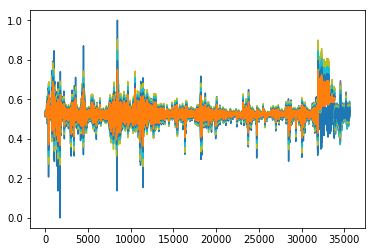

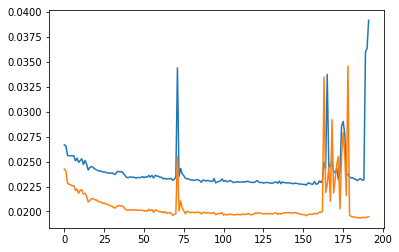

Epoch 1/1
 - 100s - loss: 5.1846e-04
Train Score: 0.02311 RMSE
Test Score: 0.01964 RMSE


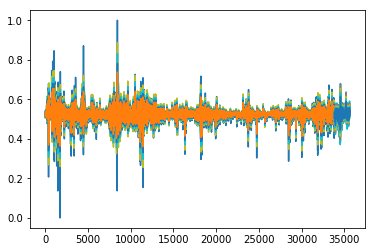

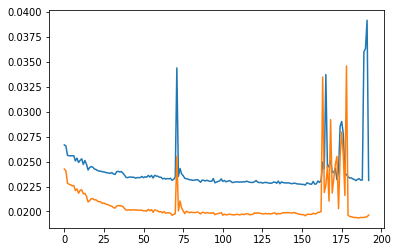

Epoch 1/1
 - 99s - loss: 5.1988e-04
Train Score: 0.04448 RMSE
Test Score: 0.01962 RMSE


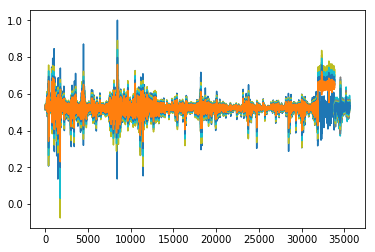

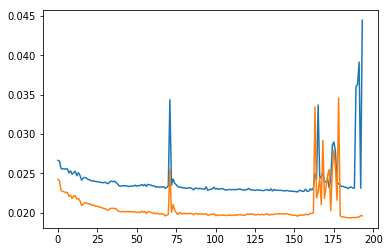

Epoch 1/1
 - 101s - loss: 5.5637e-04
Train Score: 0.04688 RMSE
Test Score: 0.04380 RMSE


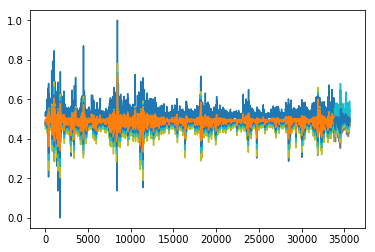

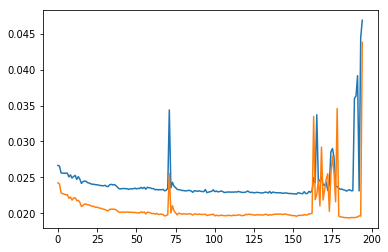

Epoch 1/1
 - 99s - loss: 5.2884e-04
Train Score: 0.02680 RMSE
Test Score: 0.02137 RMSE


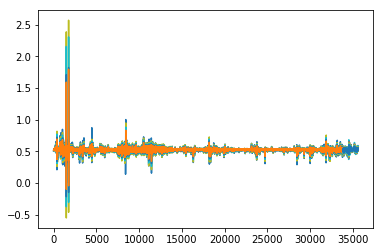

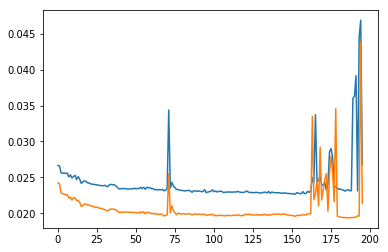

Epoch 1/1
 - 100s - loss: 5.1719e-04
Train Score: 0.02590 RMSE
Test Score: 0.01949 RMSE


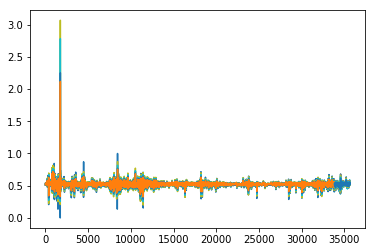

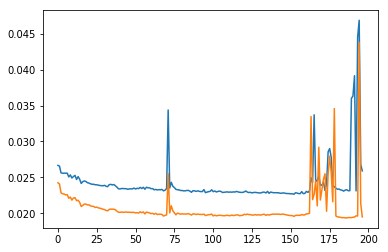

Epoch 1/1
 - 99s - loss: 6.0197e-04
Train Score: 0.02326 RMSE
Test Score: 0.01952 RMSE


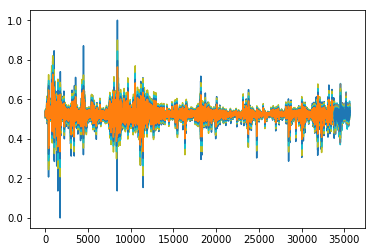

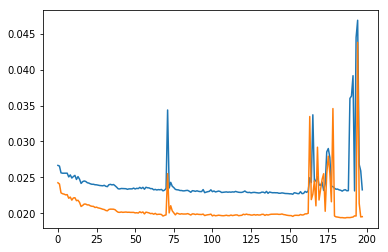

Epoch 1/1
 - 98s - loss: 6.4814e-04
Train Score: 0.02541 RMSE
Test Score: 0.01961 RMSE


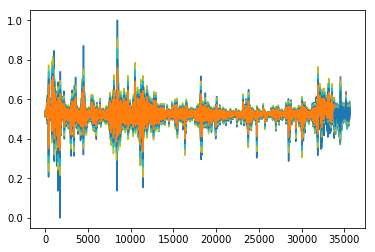

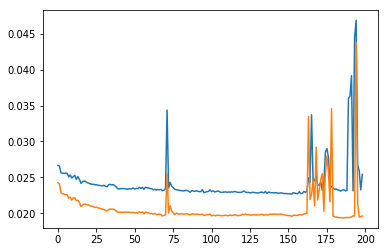

Epoch 1/1
 - 100s - loss: 6.1002e-04
Train Score: 0.02644 RMSE
Test Score: 0.01956 RMSE


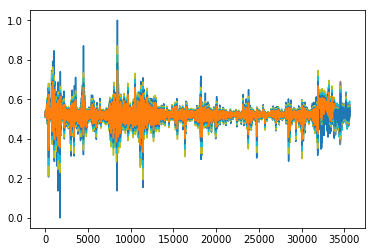

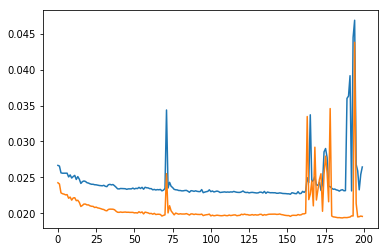

Epoch 1/1
 - 99s - loss: 5.3386e-04
Train Score: 0.02306 RMSE
Test Score: 0.02195 RMSE


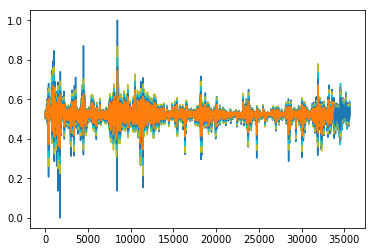

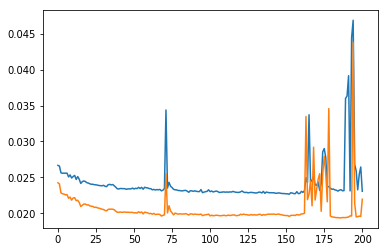

Epoch 1/1
 - 99s - loss: 5.2470e-04
Train Score: 0.02512 RMSE
Test Score: 0.02600 RMSE


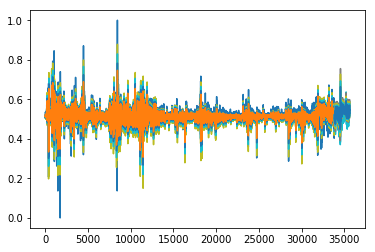

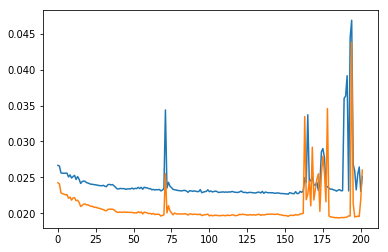

Epoch 1/1
 - 101s - loss: 7.4223e-04
Train Score: 0.02366 RMSE
Test Score: 0.02086 RMSE


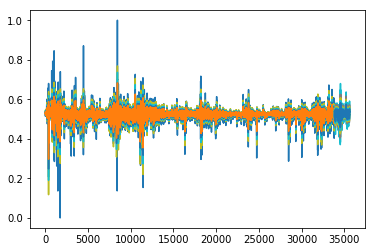

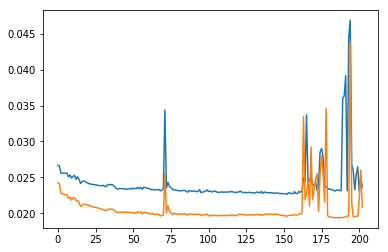

Epoch 1/1
 - 99s - loss: 5.3674e-04
Train Score: 0.02298 RMSE
Test Score: 0.02001 RMSE


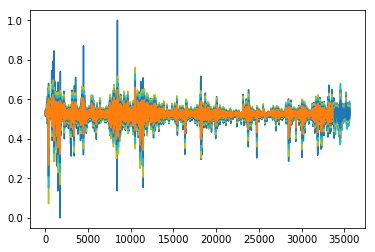

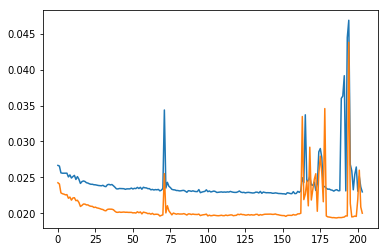

Epoch 1/1
 - 100s - loss: 5.2027e-04
Train Score: 0.02293 RMSE
Test Score: 0.01984 RMSE


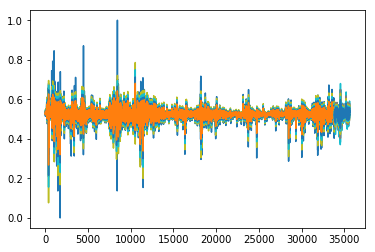

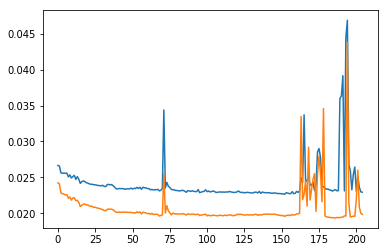

Epoch 1/1
 - 100s - loss: 5.1837e-04
Train Score: 0.02300 RMSE
Test Score: 0.01988 RMSE


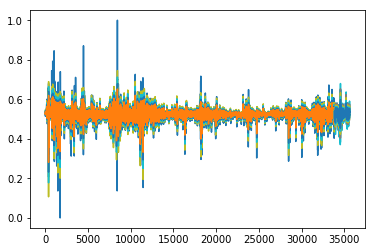

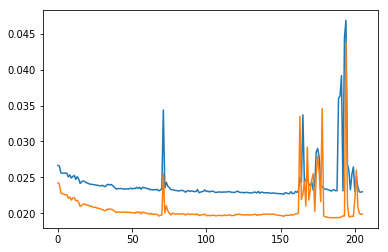

Epoch 1/1
 - 99s - loss: 5.1622e-04
Train Score: 0.02283 RMSE
Test Score: 0.01973 RMSE


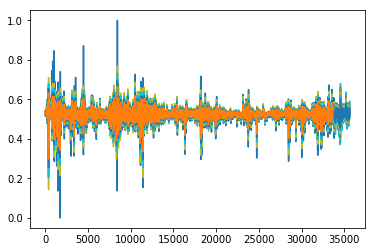

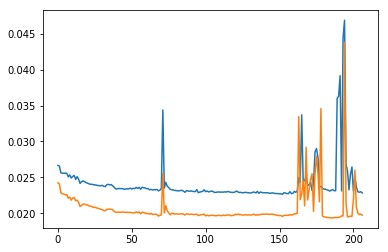

Epoch 1/1
 - 102s - loss: 5.1394e-04
Train Score: 0.02286 RMSE
Test Score: 0.01976 RMSE


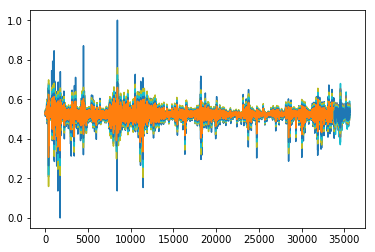

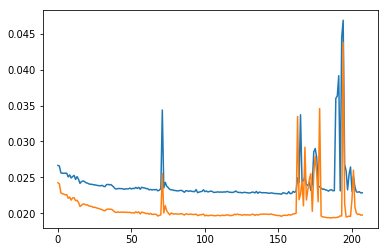

Epoch 1/1
 - 100s - loss: 5.1172e-04
Train Score: 0.02285 RMSE
Test Score: 0.01979 RMSE


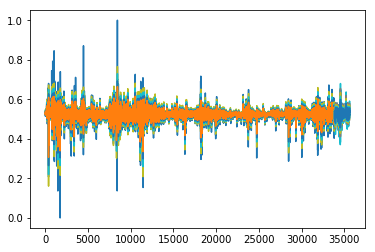

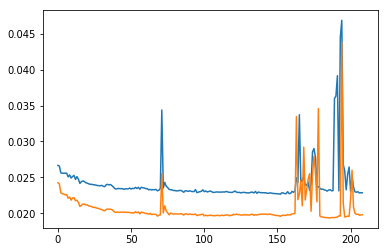

Epoch 1/1
 - 99s - loss: 5.1212e-04
Train Score: 0.02287 RMSE
Test Score: 0.01990 RMSE


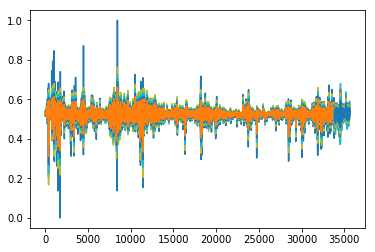

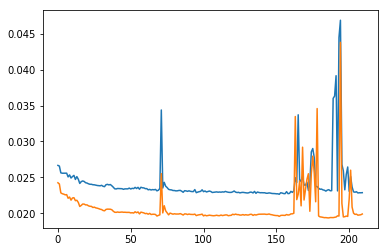

Epoch 1/1
 - 101s - loss: 5.1134e-04
Train Score: 0.02283 RMSE
Test Score: 0.01995 RMSE


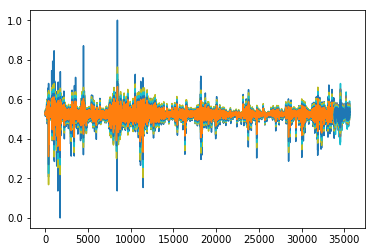

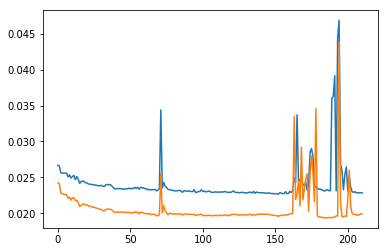

Epoch 1/1
 - 98s - loss: 5.1094e-04
Train Score: 0.02282 RMSE
Test Score: 0.01998 RMSE


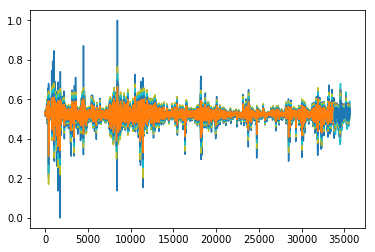

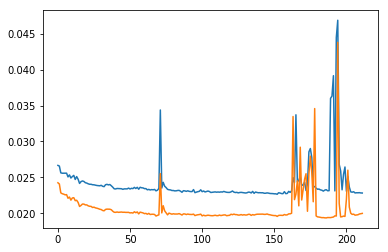

Epoch 1/1
 - 100s - loss: 5.1030e-04
Train Score: 0.02279 RMSE
Test Score: 0.01995 RMSE


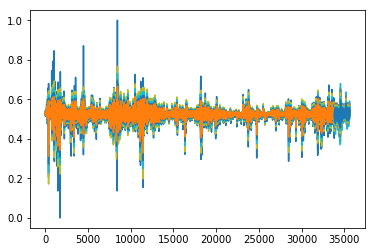

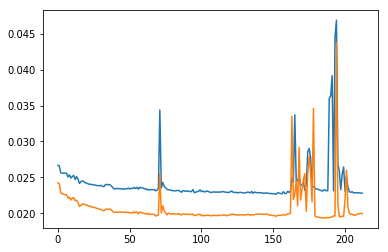

Epoch 1/1
 - 99s - loss: 5.0994e-04
Train Score: 0.02276 RMSE
Test Score: 0.01984 RMSE


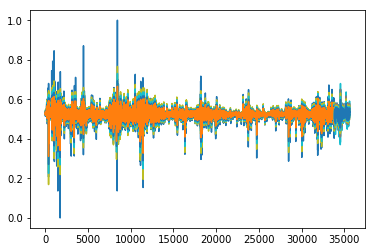

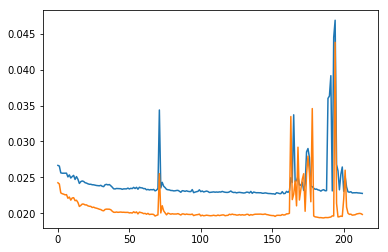

Epoch 1/1
 - 98s - loss: 5.1054e-04
Train Score: 0.02276 RMSE
Test Score: 0.01979 RMSE


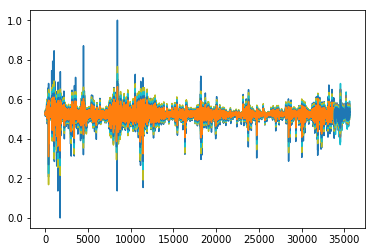

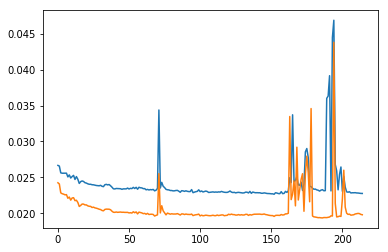

Epoch 1/1
 - 100s - loss: 5.0937e-04
Train Score: 0.02274 RMSE
Test Score: 0.01978 RMSE


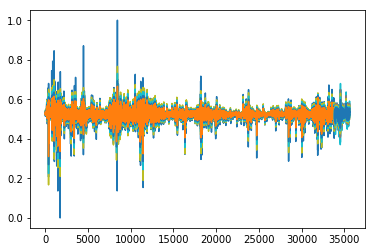

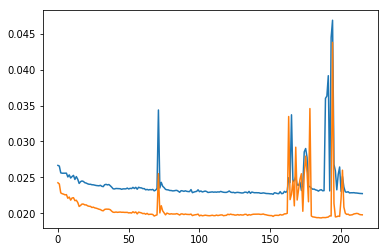

Epoch 1/1
 - 98s - loss: 5.0981e-04
Train Score: 0.02276 RMSE
Test Score: 0.01969 RMSE


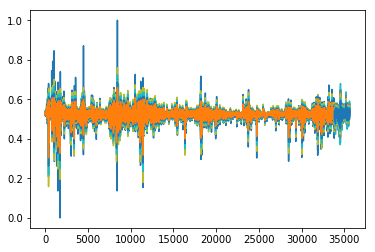

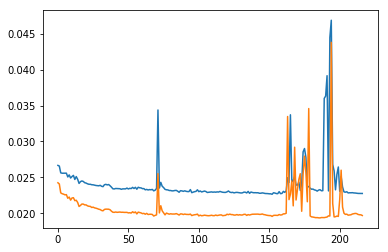

Epoch 1/1
 - 100s - loss: 5.1013e-04
Train Score: 0.02272 RMSE
Test Score: 0.01965 RMSE


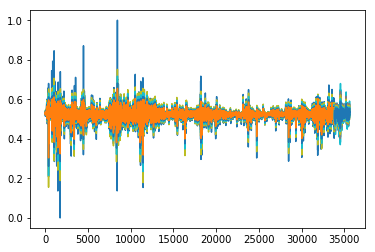

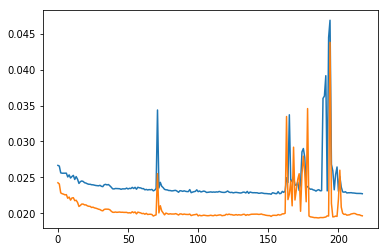

Epoch 1/1
 - 101s - loss: 5.0968e-04
Train Score: 0.02270 RMSE
Test Score: 0.01957 RMSE


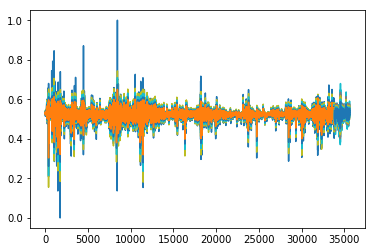

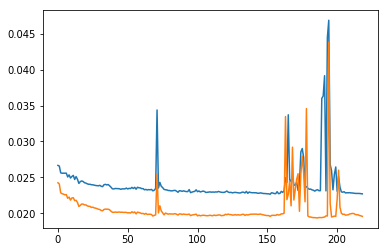

Epoch 1/1
 - 99s - loss: 5.0877e-04
Train Score: 0.02269 RMSE
Test Score: 0.01952 RMSE


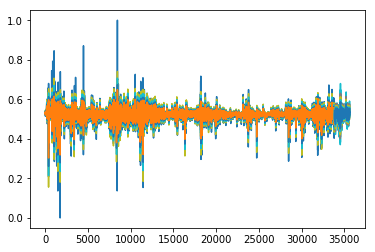

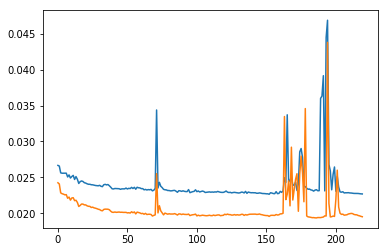

Epoch 1/1
 - 99s - loss: 5.0839e-04
Train Score: 0.02265 RMSE
Test Score: 0.01949 RMSE


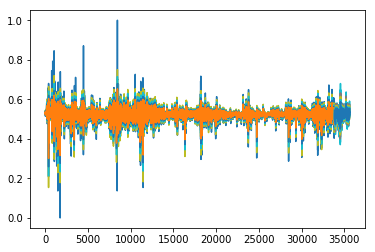

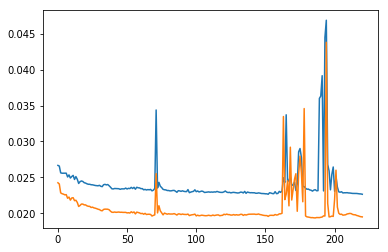

Epoch 1/1
 - 101s - loss: 5.0848e-04
Train Score: 0.02259 RMSE
Test Score: 0.01938 RMSE


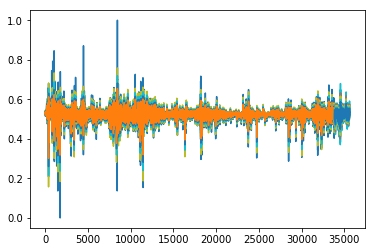

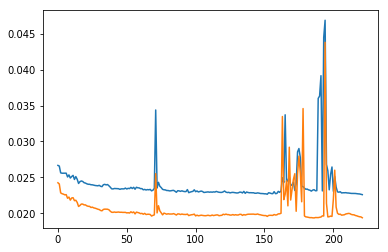

Epoch 1/1
 - 98s - loss: 5.0609e-04
Train Score: 0.02253 RMSE
Test Score: 0.01929 RMSE


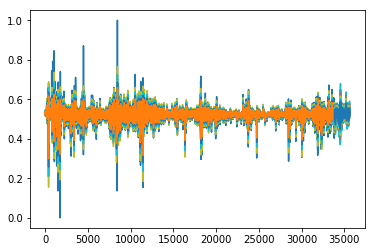

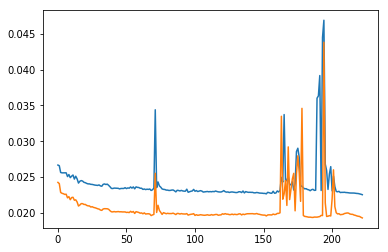

Epoch 1/1
 - 101s - loss: 5.0624e-04
Train Score: 0.02250 RMSE
Test Score: 0.01925 RMSE


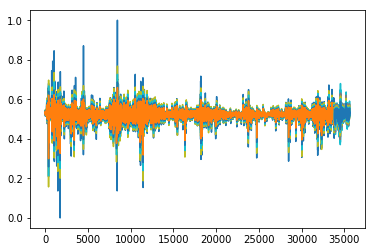

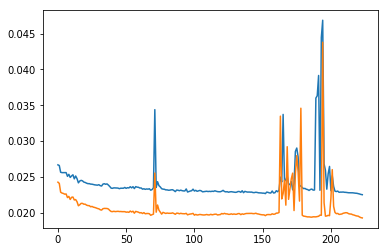

Epoch 1/1
 - 100s - loss: 5.0589e-04
Train Score: 0.02249 RMSE
Test Score: 0.01922 RMSE


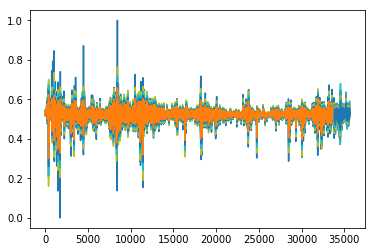

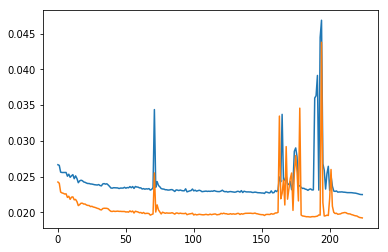

Epoch 1/1
 - 99s - loss: 5.0551e-04
Train Score: 0.02247 RMSE
Test Score: 0.01920 RMSE


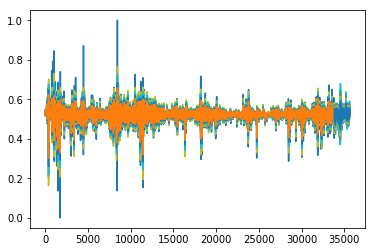

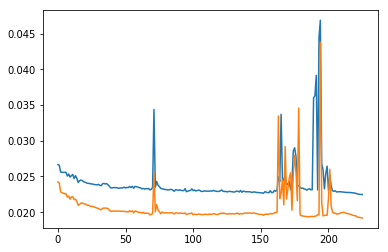

Epoch 1/1
 - 100s - loss: 5.0479e-04
Train Score: 0.02248 RMSE
Test Score: 0.01920 RMSE


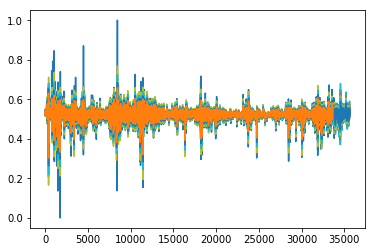

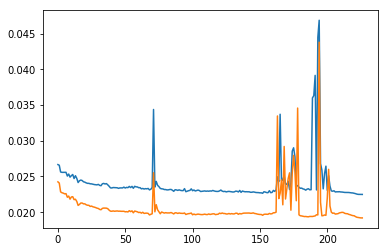

Epoch 1/1
 - 98s - loss: 5.0485e-04
Train Score: 0.02248 RMSE
Test Score: 0.01920 RMSE


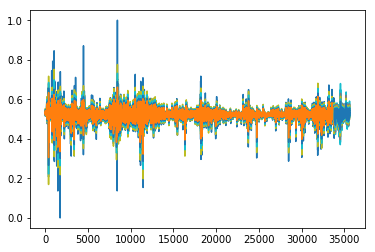

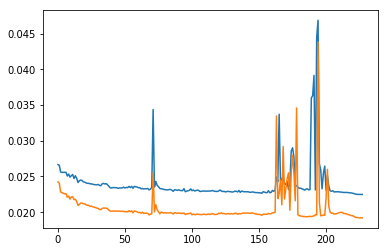

Epoch 1/1
 - 99s - loss: 5.0418e-04
Train Score: 0.02247 RMSE
Test Score: 0.01921 RMSE


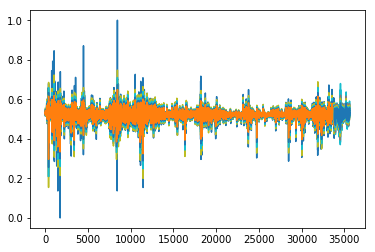

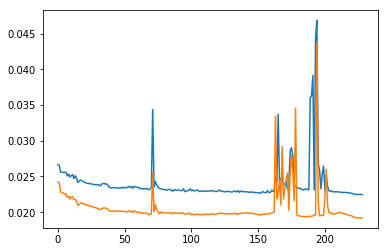

Epoch 1/1
 - 100s - loss: 5.0834e-04
Train Score: 0.02256 RMSE
Test Score: 0.01927 RMSE


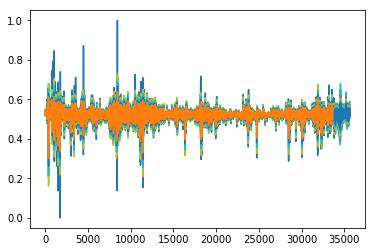

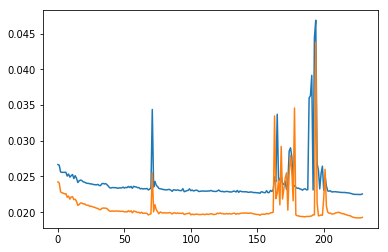

Epoch 1/1
 - 98s - loss: 5.0697e-04
Train Score: 0.02254 RMSE
Test Score: 0.01923 RMSE


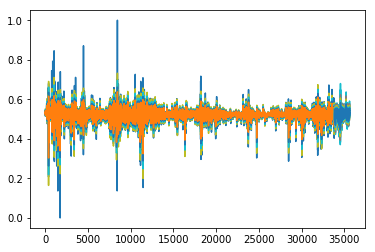

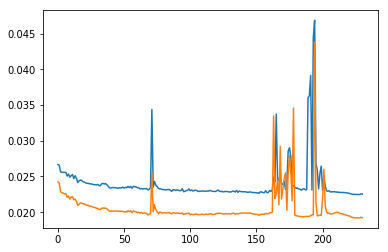

Epoch 1/1
 - 100s - loss: 5.0724e-04
Train Score: 0.02253 RMSE
Test Score: 0.01927 RMSE


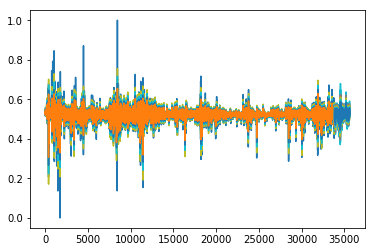

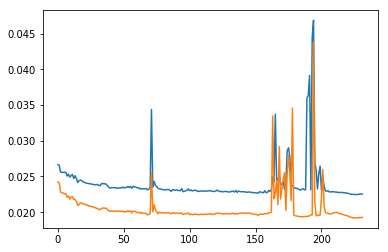

Epoch 1/1
 - 98s - loss: 5.0656e-04
Train Score: 0.02253 RMSE
Test Score: 0.01924 RMSE


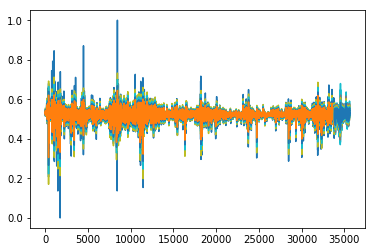

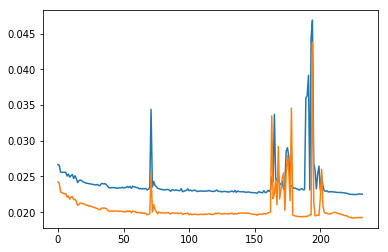

Epoch 1/1
 - 99s - loss: 5.0738e-04
Train Score: 0.02255 RMSE
Test Score: 0.01924 RMSE


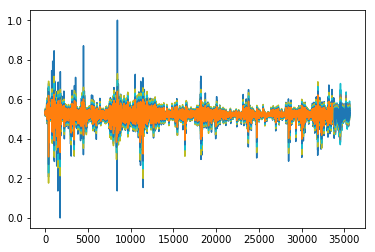

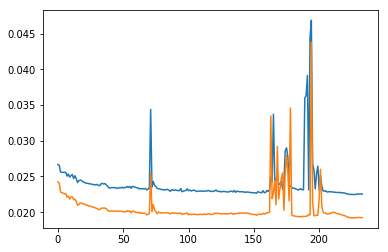

Epoch 1/1
 - 100s - loss: 5.0938e-04
Train Score: 0.02257 RMSE
Test Score: 0.01920 RMSE


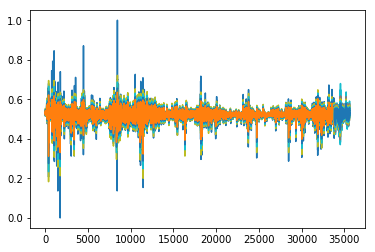

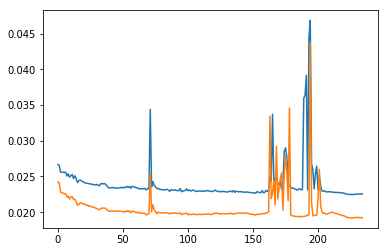

Epoch 1/1
 - 98s - loss: 5.0885e-04
Train Score: 0.02256 RMSE
Test Score: 0.01925 RMSE


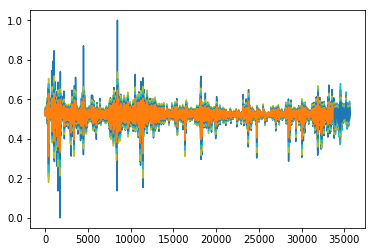

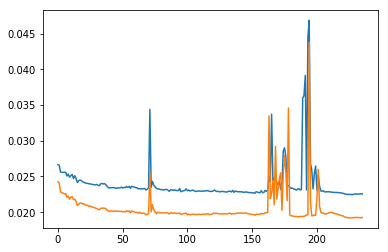

Epoch 1/1
 - 100s - loss: 5.0754e-04
Train Score: 0.02259 RMSE
Test Score: 0.01924 RMSE


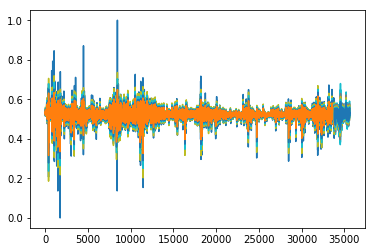

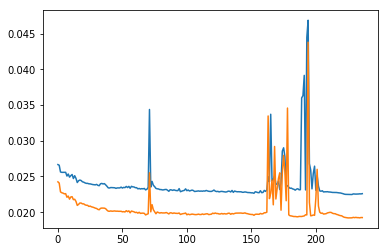

Epoch 1/1
 - 99s - loss: 5.0712e-04
Train Score: 0.02259 RMSE
Test Score: 0.01926 RMSE


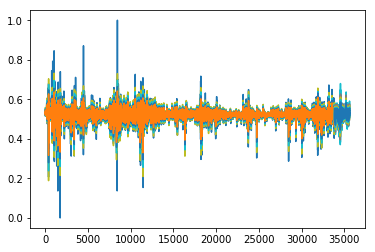

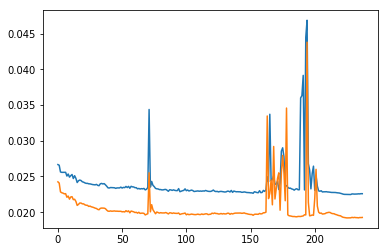

Epoch 1/1
 - 99s - loss: 5.0778e-04
Train Score: 0.02257 RMSE
Test Score: 0.01926 RMSE


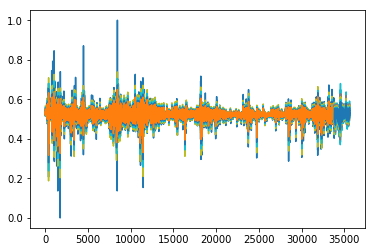

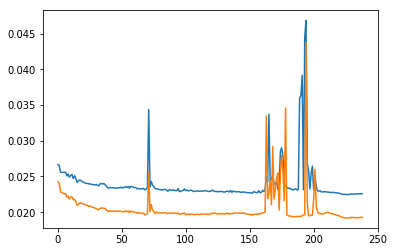

Epoch 1/1
 - 101s - loss: 5.0760e-04
Train Score: 0.02260 RMSE
Test Score: 0.01929 RMSE


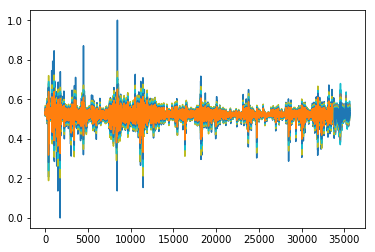

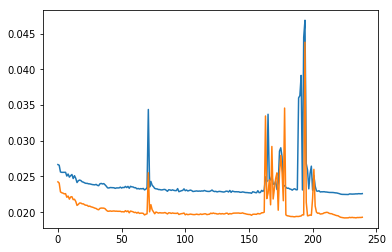

Epoch 1/1
 - 98s - loss: 5.0724e-04
Train Score: 0.02265 RMSE
Test Score: 0.01931 RMSE


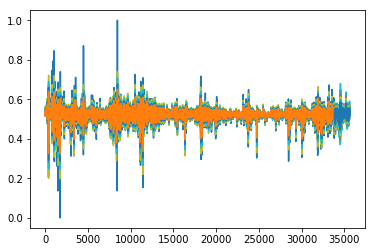

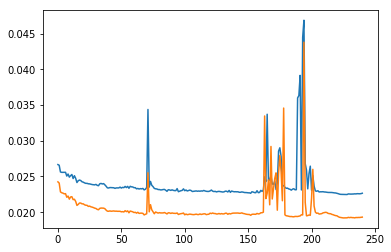

Epoch 1/1
 - 100s - loss: 5.0819e-04
Train Score: 0.02259 RMSE
Test Score: 0.01925 RMSE


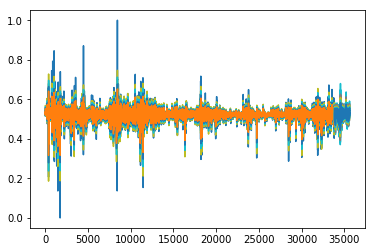

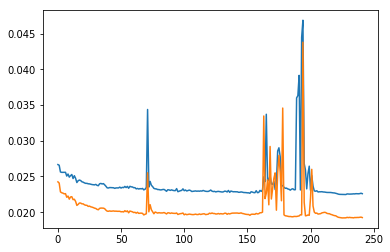

Epoch 1/1
 - 99s - loss: 5.0810e-04
Train Score: 0.02271 RMSE
Test Score: 0.01920 RMSE


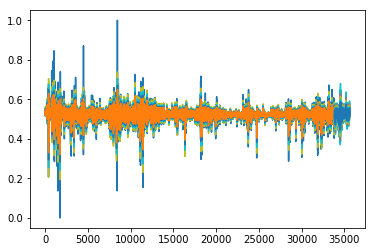

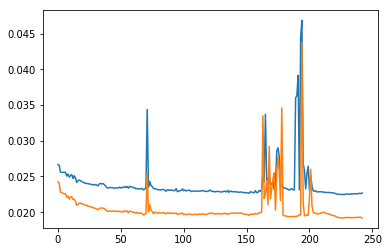

Epoch 1/1
 - 98s - loss: 5.1034e-04
Train Score: 0.02264 RMSE
Test Score: 0.01926 RMSE


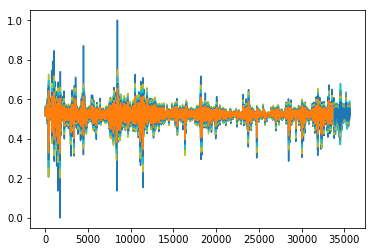

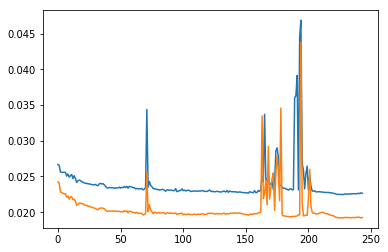

Epoch 1/1
 - 100s - loss: 5.0946e-04
Train Score: 0.02266 RMSE
Test Score: 0.01928 RMSE


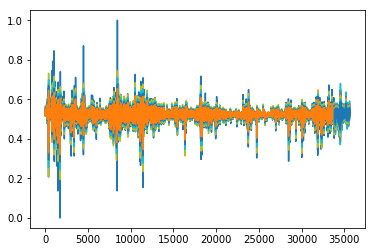

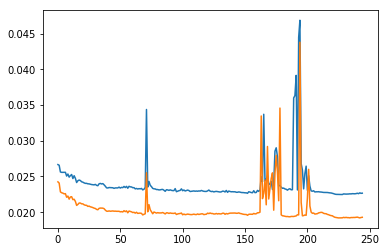

Epoch 1/1
 - 99s - loss: 5.0948e-04
Train Score: 0.02265 RMSE
Test Score: 0.01921 RMSE


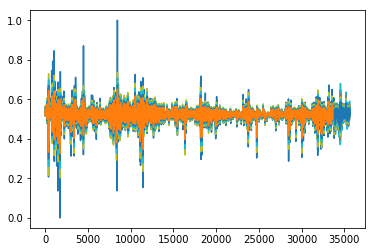

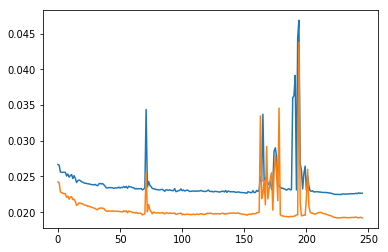

Epoch 1/1
 - 99s - loss: 5.0815e-04
Train Score: 0.02263 RMSE
Test Score: 0.01924 RMSE


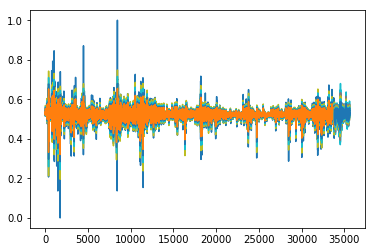

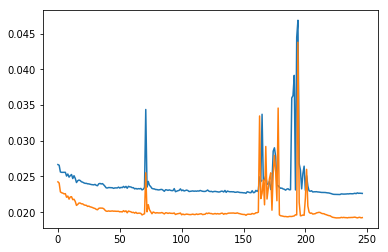

Epoch 1/1
 - 100s - loss: 5.0962e-04
Train Score: 0.02266 RMSE
Test Score: 0.01929 RMSE


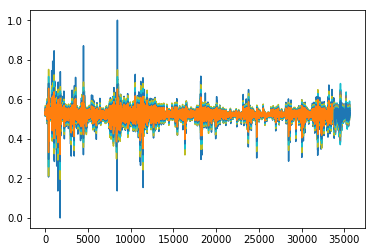

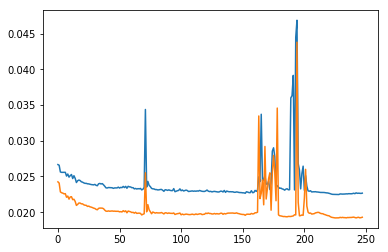

Epoch 1/1
 - 99s - loss: 5.0933e-04
Train Score: 0.02266 RMSE
Test Score: 0.01927 RMSE


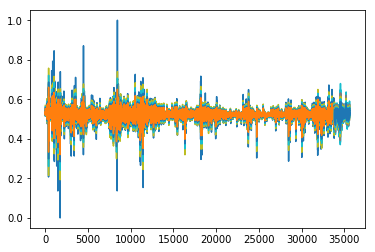

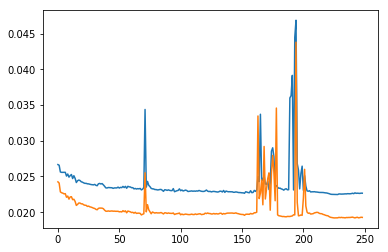

Epoch 1/1
 - 102s - loss: 5.0925e-04
Train Score: 0.02267 RMSE
Test Score: 0.01925 RMSE


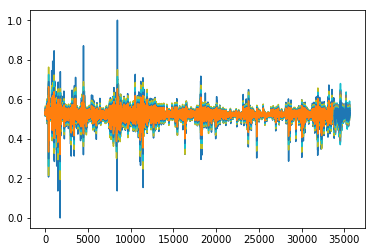

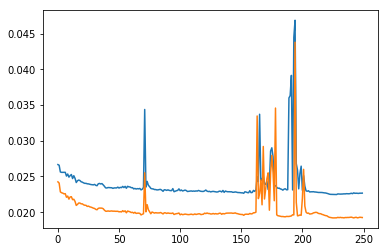

Epoch 1/1
 - 99s - loss: 5.0998e-04
Train Score: 0.02270 RMSE
Test Score: 0.01927 RMSE


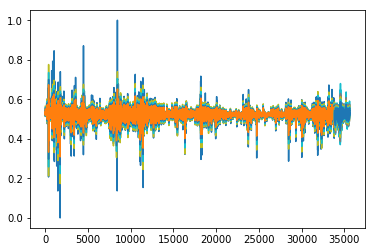

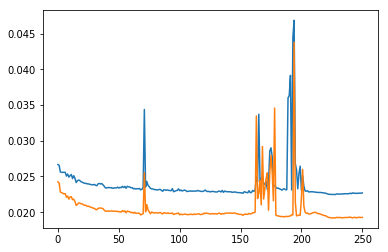

Epoch 1/1
 - 99s - loss: 5.1095e-04
Train Score: 0.02274 RMSE
Test Score: 0.01932 RMSE


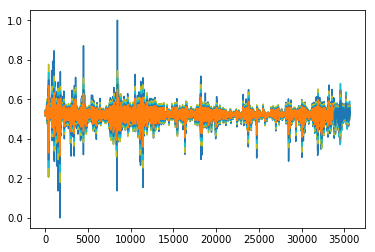

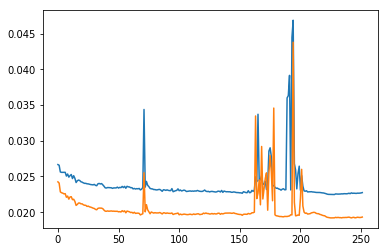

Epoch 1/1
 - 101s - loss: 5.0985e-04
Train Score: 0.02267 RMSE
Test Score: 0.01927 RMSE


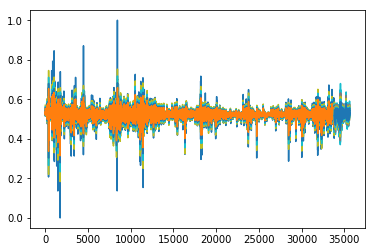

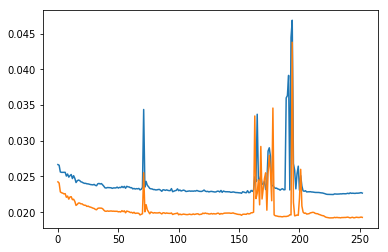

Epoch 1/1
 - 99s - loss: 5.0790e-04
Train Score: 0.02270 RMSE
Test Score: 0.01927 RMSE


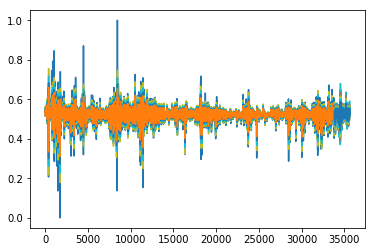

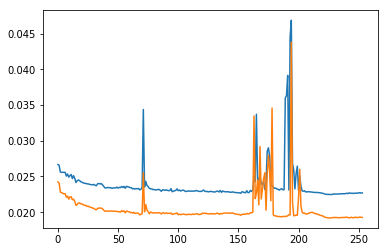

Epoch 1/1
 - 99s - loss: 5.0887e-04
Train Score: 0.02266 RMSE
Test Score: 0.01925 RMSE


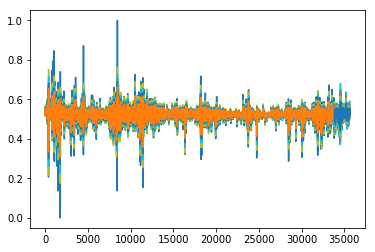

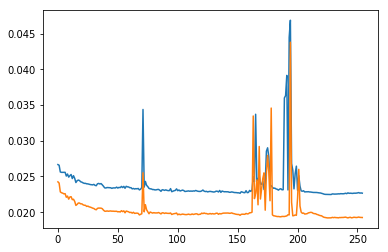

Epoch 1/1
 - 100s - loss: 5.0790e-04
Train Score: 0.02275 RMSE
Test Score: 0.01934 RMSE


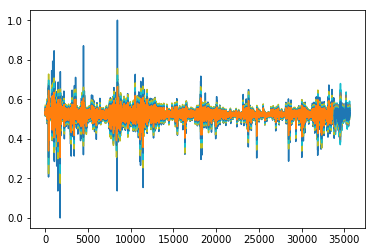

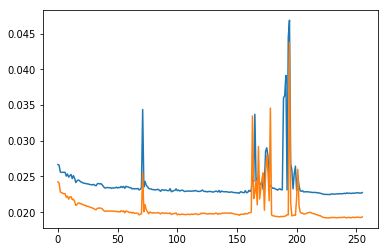

Epoch 1/1
 - 98s - loss: 5.0784e-04
Train Score: 0.02275 RMSE
Test Score: 0.01938 RMSE


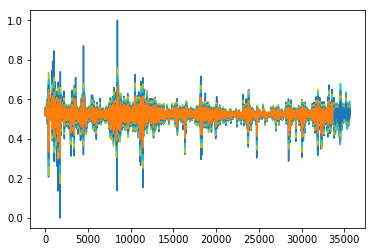

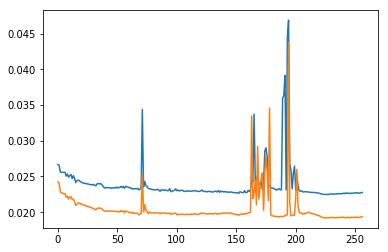

Epoch 1/1
 - 102s - loss: 5.0809e-04
Train Score: 0.02270 RMSE
Test Score: 0.01929 RMSE


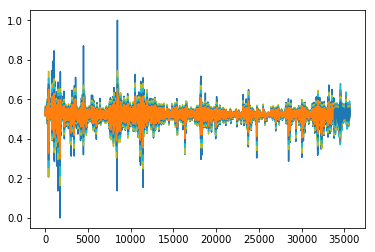

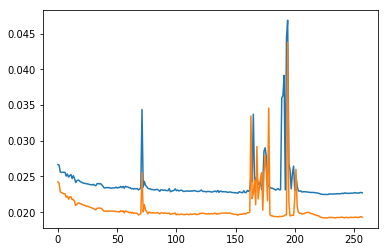

Epoch 1/1
 - 101s - loss: 5.0967e-04
Train Score: 0.02273 RMSE
Test Score: 0.01932 RMSE


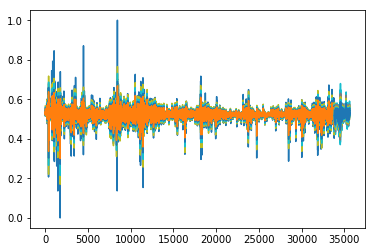

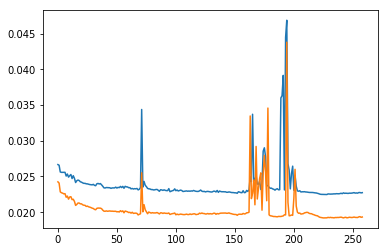

Epoch 1/1
 - 107s - loss: 5.0821e-04
Train Score: 0.02273 RMSE
Test Score: 0.01931 RMSE


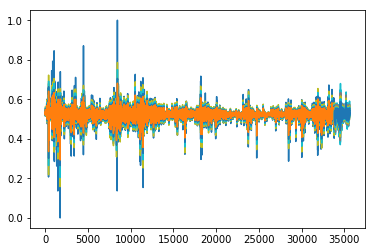

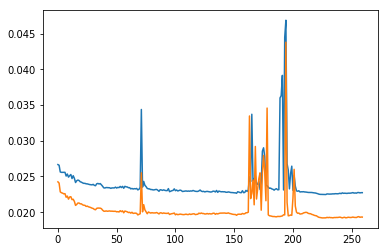

Epoch 1/1
 - 106s - loss: 5.0708e-04
Train Score: 0.02271 RMSE
Test Score: 0.01928 RMSE


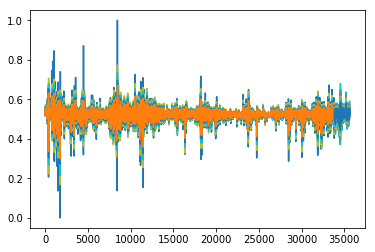

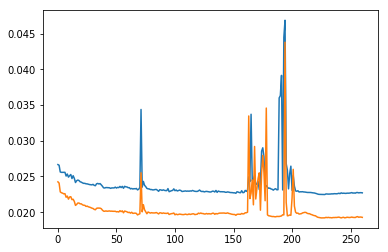

Epoch 1/1
 - 110s - loss: 5.0853e-04
Train Score: 0.02274 RMSE
Test Score: 0.01929 RMSE


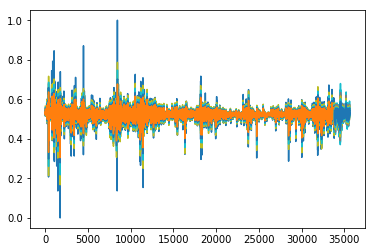

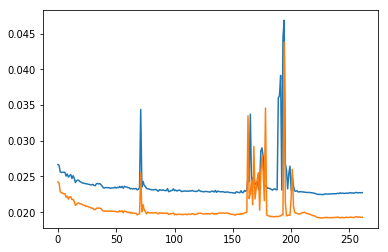

Epoch 1/1
 - 106s - loss: 5.0818e-04
Train Score: 0.02270 RMSE
Test Score: 0.01937 RMSE


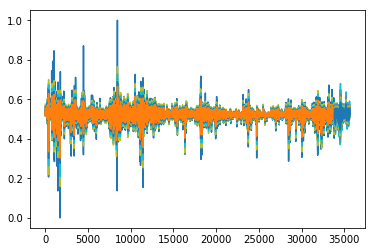

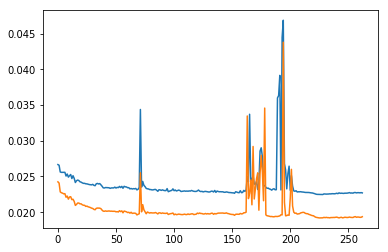

Epoch 1/1
 - 108s - loss: 5.0753e-04
Train Score: 0.02270 RMSE
Test Score: 0.01939 RMSE


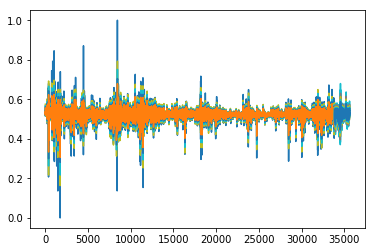

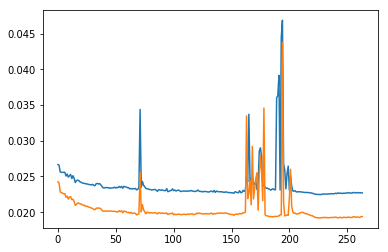

Epoch 1/1
 - 110s - loss: 5.0792e-04
Train Score: 0.02267 RMSE
Test Score: 0.01933 RMSE


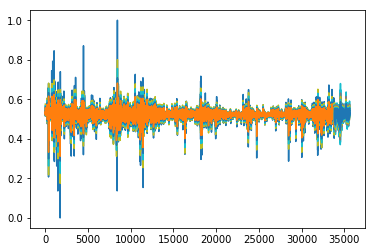

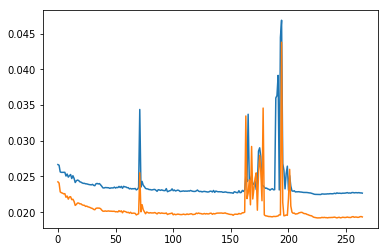

Epoch 1/1


KeyboardInterrupt: 

In [12]:
trainError = []
testError = []

for i in range(300):
    model.fit(trainX, trainY, epochs=1, batch_size=batch_size, verbose=2, shuffle=False)
    model.reset_states()
    model.save_weights("model_forward.h5")
    
    model_test = model
    
    # make predictions
    trainPredict = model_test.predict(trainX, batch_size=batch_size)
    model_test.reset_states()
    testPredict = model_test.predict(testX, batch_size=batch_size)

    trainPredict_t = scaler_price.inverse_transform(trainPredict)
    trainY_t = scaler_price.inverse_transform(trainY)
    testPredict_t = scaler_price.inverse_transform(testPredict)
    testY_t = scaler_price.inverse_transform(testY)
    
    # calculate root mean squared error
    trainScore = math.sqrt(mean_squared_error(trainY_t, trainPredict_t))
    trainError.append(trainScore)
    print('Train Score: %.5f RMSE' % (trainScore))
    testScore = math.sqrt(mean_squared_error(testY_t, testPredict_t))
    testError.append(testScore)
    print('Test Score: %.5f RMSE' % (testScore))
    
    # shift train predictions for plotting
    trainYPlot = np.empty_like(dataset)
    trainYPlot[:, :] = np.nan
    trainYPlot[look_back-1:len(trainPredict_t)+look_back-1,0] = trainY_t[:,0]
    # shift test predictions for plotting
    testYPlot = np.empty_like(dataset)
    testYPlot[:, :] = np.nan
    testYPlot[len(trainPredict_t)+look_back-1+look_forward:len(trainPredict_t)+look_back-1+look_forward+len(testPredict_t),0] = testY_t[:,0]
    
    # shift train predictions for plotting
    trainPredictPlot = np.empty_like(dataset)
    trainPredictPlot[:, :] = np.nan
    trainPredictPlot[look_back-1:len(trainPredict_t)+look_back-1,:look_forward] = trainPredict_t
    # shift test predictions for plotting
    testPredictPlot = np.empty_like(dataset)
    testPredictPlot[:, :] = np.nan
    testPredictPlot[len(trainPredict_t)+look_back-1+look_forward:len(trainPredict_t)+look_back-1+look_forward+len(testPredict_t),:look_forward] = testPredict_t
    # plot baseline and predictions
    plt.plot(trainYPlot)
    plt.plot(testYPlot)
    plt.plot(trainPredictPlot)
    plt.plot(testPredictPlot)
    plt.show()
    
    plt.plot(trainError)
    plt.plot(testError)
    plt.show()

In [ ]:
print(trainYPlot.shape)
print(trainPredictPlot.shape)
print(testYPlot.shape)
print(testPredictPlot.shape)


for i in range(look_forward): 
    trainYPlot[:,i] = np.exp(trainYPlot[:,i]+ewma['price'])
    testYPlot[:,i] = np.exp(testYPlot[:,i]+ewma['price'])
    trainPredictPlot[:,i] = np.exp(trainPredictPlot[:,i]+ewma['price'])
    testPredictPlot[:,i] = np.exp(testPredictPlot[:,i]+ewma['price'])

# print(trainYPlot)
# print(trainPredictPlot)
# print(testYPlot)
# print(testPredictPlot)



import matplotlib

matplotlib.rcParams['figure.figsize'] = (18,16)
# plt.plot(trainYPlot2['price'])
# plt.plot(testYPlot2['price'])
# plt.plot(trainPredictPlot2['price'])
# plt.plot(testPredictPlot2['price'])
# plt.plot(trainYPlot2['price'] - trainPredictPlot2['price'])
# plt.plot(testYPlot2['price'] - testPredictPlot2['price'])
# plt.show()


plt.plot(testYPlot[:,0])
plt.plot(testPredictPlot[:,0])
plt.plot(testYPlot[:,0] - testPredictPlot[:,0])
plt.show()

plt.plot(testYPlot[:,0])
plt.plot(testPredictPlot[:,1])
plt.plot(testYPlot[:,1] - testPredictPlot[:,1])
plt.show()

plt.plot(testYPlot[:,0])
plt.plot(testPredictPlot[:,2])
plt.plot(testYPlot[:,2] - testPredictPlot[:,2])
plt.show()

trainYError = trainYPlot.replace([np.inf, -np.inf], np.nan).dropna(how="all")
trainPredictError = trainPredictPlot.replace([np.inf, -np.inf], np.nan).dropna(how="all")
testYError = testYPlot.replace([np.inf, -np.inf], np.nan).dropna(how="all")
testPredictError = testPredictPlot.replace([np.inf, -np.inf], np.nan).dropna(how="all")

# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(trainYError, trainPredictError))
print('Train Score: %.5f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testYError, testPredictError))
print('Test Score: %.5f RMSE' % (testScore))

for i in range(look_forward):
    print('Test Score %: %.5f RMSE' % (i, math.sqrt(mean_squared_error(testYError[:,i], testPredictError[:,i]))))